In [46]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import sys,os
    
metroidpath = os.path.abspath('../')
if metroidpath not in sys.path:
    sys.path.append(metroidpath)
items = os.listdir(metroidpath)
if 'MES.py' not in items:
    ! jupyter nbconvert --to python ../MES.ipynb --output-dir ../
if 'Remove_Photobleaching.py' not in items:
    ! jupyter nbconvert --to 'python' ../Remove_Photobleaching.ipynb --output-dir ../
if 'BSSD.py' not in items:
    ! jupyter nbconvert --to 'python' ../BSSD.ipynb --output-dir ../
if 'METROID.py' not in items:
    ! jupyter nbconvert --to 'python' ../METROID.ipynb --output-dir ../
import MES as mes
import Remove_Photobleaching as rpb
import BSSD as bssd
import METROID as metroid
    


## Mandatory Parameters:

In [47]:
fpath = '../Data\\Cell4'
fr_list = [63, 64.45, 64.45, 63.12] #Cell4
transitory=None

## Minimal information provided:
    * **estimated t_sig_onset;**
    - **estimated t_sig_end;**
    - default method ('wPCA');
    - default n_comp (2);
    - default wavelet ('Haar');
    - autoselect source with signal.

In [48]:
v0path = fpath + '\\video0'
transitory = None

ROIs_mask_0, label_ROIs_0, ROIs_means_filtered_0, time_0, \
ROIs_means_0, ROIs_means_corrected_0, corrections_0, \
mask_list_0, sources_0, selected_source_idx_0, \
t_sig_prop_0, SNR_dB_0 = metroid.metroid(v0path, fr_list[0], transitory)

vmidpath = fpath + '\\videos_AP'
transitory = True

ROIs_mask_AP, label_ROIs_AP, ROIs_means_filtered_AP, time_AP, \
ROIs_means_AP, ROIs_means_corrected_AP, corrections_AP, \
mask_list_AP, sources_AP, selected_source_idx_AP, \
t_sig_prop_AP, SNR_dB_AP = metroid.metroid(vmidpath, fr_list[1:-1], transitory)


vlastpath = fpath + '\\video_EP'
transitory = False

ROIs_mask_EP, label_ROIs_EP, ROIs_means_filtered_EP, time_EP, \
ROIs_means_EP, ROIs_means_corrected_EP, corrections_EP, \
mask_list_EP, sources_EP, selected_source_idx_EP, \
t_sig_prop_EP, SNR_dB_EP = metroid.metroid(vlastpath, fr_list[-1], transitory)



                                                

## Plot the results:
### 1. Video0

In [49]:
nregions = np.amax(label_ROIs_0).astype(int)
ncolors = nregions
from matplotlib import cm
from matplotlib.colors import ListedColormap
brg = cm.get_cmap('brg', nregions)
newcolors = np.tile((np.arange(0,ncolors))/(ncolors-1),nregions//(ncolors-1))
newcolors = newcolors[:nregions]
newcolors = brg(newcolors)
black = np.array([0, 0, 0, 1])
newcolors = np.insert(newcolors,0,black,axis=0)
newcmp = ListedColormap(newcolors)

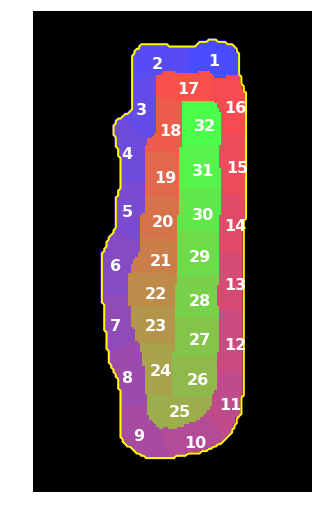

In [50]:
fig, ax = plt.subplots(figsize=[5,10],nrows=1, ncols=1)
ax.imshow(label_ROIs_0, cmap=newcmp)

cent_coord = np.zeros((nregions,2))
fontsize=16
for j in range(nregions):
#     a = np.zeros_like(label_ROIs).astype(bool)
#     a[ROIs_means==j+1] = True
    cent_coord[j,:] = np.rint(mes.get_centroid(ROIs_mask_0[j,:,:]))
    offset = -fontsize//2
    ax.annotate(j+1,(cent_coord[j,0],cent_coord[j,1]),xycoords='data',xytext=(offset, offset),
                textcoords='offset points',color='white',fontsize=fontsize,weight='bold')
ax.axis('off')
contour = mes.build_contour(mask_list_0[0])
ax.imshow(mask_list_0[0],cmap='gray',alpha=0.3)
ax.plot(contour[:,1],contour[:,0],color='yellow',lw=2)


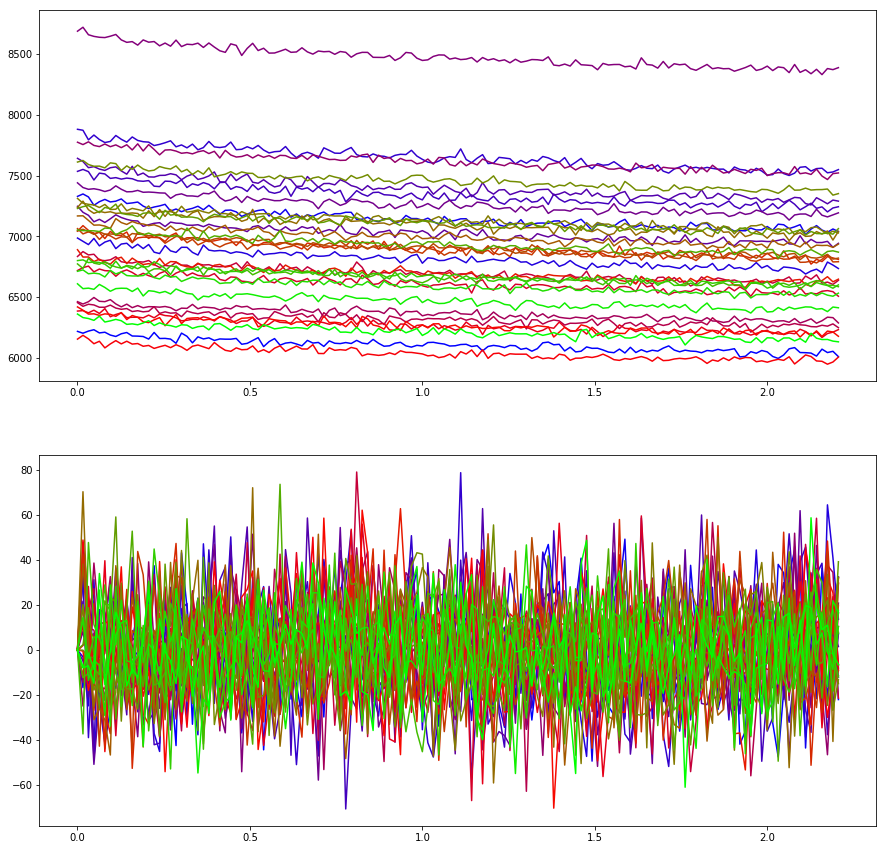

In [51]:
fig, ax = plt.subplots(nrows=2,ncols=1,figsize=[15,15])
for j in range(ROIs_mask_0.shape[0]):
    ax[0].plot(time_0,ROIs_means_0[:,j],color=newcolors[j+1,:])
    ax[1].plot(time_0,ROIs_means_corrected_0[:,j],color=newcolors[j+1,:])

### 2. Videos_AP

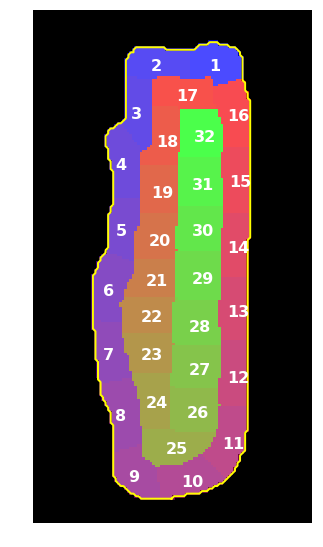

In [52]:
fig, ax = plt.subplots(figsize=[5,10],nrows=1, ncols=1)
ax.imshow(label_ROIs_AP, cmap=newcmp)

cent_coord = np.zeros((nregions,2))
fontsize=16
for j in range(nregions):
#     a = np.zeros_like(label_ROIs).astype(bool)
#     a[ROIs_means==j+1] = True
    cent_coord[j,:] = np.rint(mes.get_centroid(ROIs_mask_AP[j,:,:]))
    offset = -fontsize//2
    ax.annotate(j+1,(cent_coord[j,0],cent_coord[j,1]),xycoords='data',xytext=(offset, offset),
                textcoords='offset points',color='white',fontsize=fontsize,weight='bold')
ax.axis('off')
contour = mes.build_contour(mask_list_AP[0])
ax.imshow(mask_list_AP[0],cmap='gray',alpha=0.3)
ax.plot(contour[:,1],contour[:,0],color='yellow',lw=2)


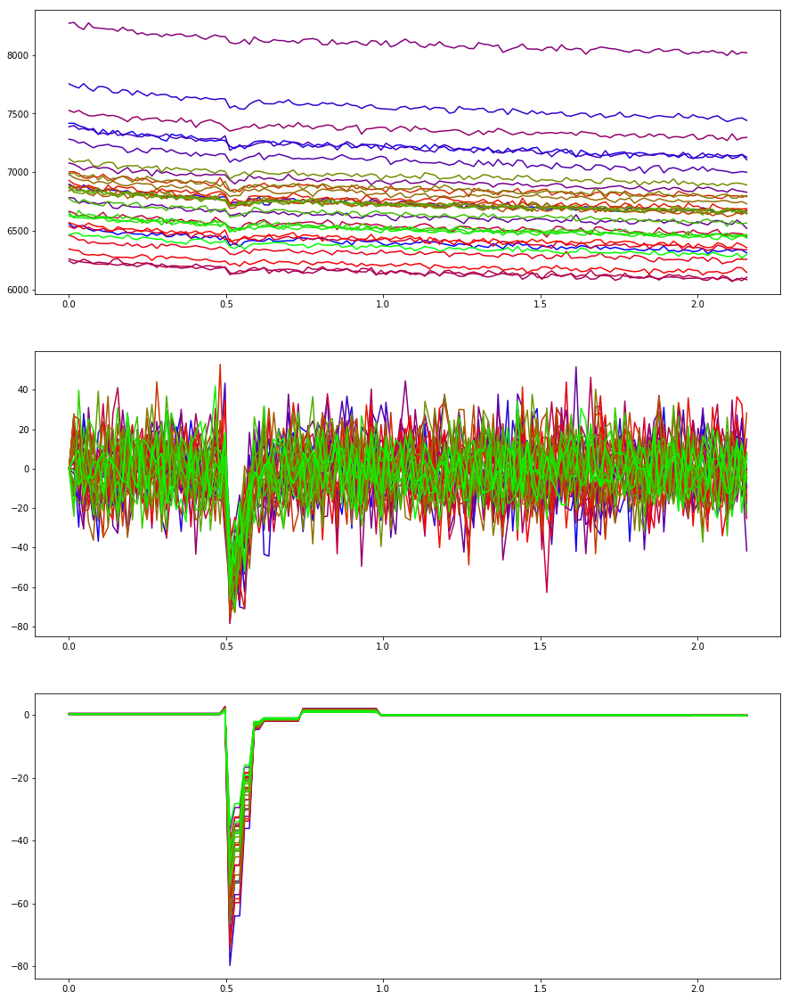

In [53]:
fig, ax = plt.subplots(nrows=3,ncols=1,figsize=[15,20])
for j in range(ROIs_mask_AP.shape[0]):
    ax[0].plot(time_AP,ROIs_means_AP[:,j],color=newcolors[j+1,:])
    ax[1].plot(time_AP,ROIs_means_corrected_AP[:,j],color=newcolors[j+1,:])
    ax[2].plot(time_AP,ROIs_means_filtered_AP[:,j],color=newcolors[j+1,:])

In [54]:
print('Signal onset time:',t_sig_prop_AP[0],'s')
print('Signal end time:',t_sig_prop_AP[1],'s')
print('Signal-to-Noise Ratio per ROI:\n',SNR_dB_AP,'dB')

Signal onset time: 0.5120248254460822 s
Signal end time: 0.574088440651668 s
Signal-to-Noise Ratio per ROI:
 [-4.2  -4.62 -7.39 -2.25 -4.55 -5.28 -9.21 -6.3  -7.23 -6.28 -7.56 -7.89
 -4.35 -5.9  -7.04 -7.57 -5.3  -3.94 -6.54 -5.91 -4.42 -5.83 -5.52 -3.96
 -7.28 -6.54 -6.33 -5.01 -5.44 -5.46 -5.78 -8.04] dB


### 3. Video_EP

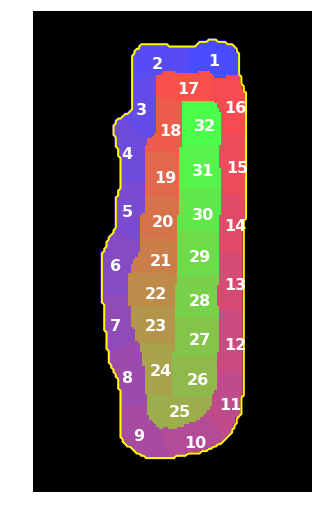

In [55]:
fig, ax = plt.subplots(figsize=[5,10],nrows=1, ncols=1)
ax.imshow(label_ROIs_EP, cmap=newcmp)

cent_coord = np.zeros((nregions,2))
fontsize=16
for j in range(nregions):
#     a = np.zeros_like(label_ROIs).astype(bool)
#     a[ROIs_means==j+1] = True
    cent_coord[j,:] = np.rint(mes.get_centroid(ROIs_mask_EP[j,:,:]))
    offset = -fontsize//2
    ax.annotate(j+1,(cent_coord[j,0],cent_coord[j,1]),xycoords='data',xytext=(offset, offset),
                textcoords='offset points',color='white',fontsize=fontsize,weight='bold')
ax.axis('off')
contour = mes.build_contour(mask_list_EP[0])
ax.imshow(mask_list_EP[0],cmap='gray',alpha=0.3)
ax.plot(contour[:,1],contour[:,0],color='yellow',lw=2)


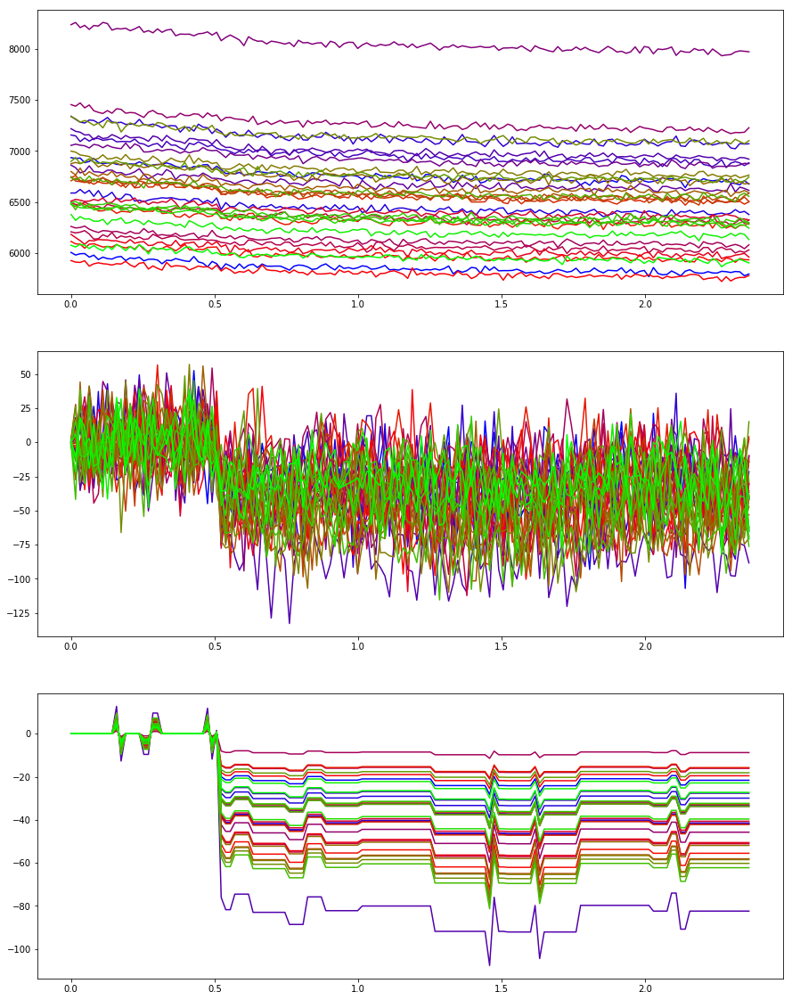

In [56]:
fig, ax = plt.subplots(nrows=3,ncols=1,figsize=[15,20])
for j in range(ROIs_mask_EP.shape[0]):
    ax[0].plot(time_EP,ROIs_means_EP[:,j],color=newcolors[j+1,:])
    ax[1].plot(time_EP,ROIs_means_corrected_EP[:,j],color=newcolors[j+1,:])
    ax[2].plot(time_EP,ROIs_means_filtered_EP[:,j],color=newcolors[j+1,:])

In [57]:
corrections_EP

In [58]:
print('Signal onset time:',t_sig_prop_EP[0],'s')
print('Signal end time:',t_sig_prop_EP[1],'s')
print('Signal-to-Noise Ratio per ROI:\n',SNR_dB_EP,'dB')

Signal onset time: 0.5228136882129277 s
Signal end time: None s
Signal-to-Noise Ratio per ROI:
 [ 2.5   8.25  1.63  5.74  1.98 11.83  1.71  3.98  5.07  5.89 -5.78 -2.7
 11.34  5.43  8.31 -0.81  9.12 -3.63  6.45  3.22  8.75  2.33  8.42  8.03
  6.69 -0.97  3.75 10.34  6.01  8.27  0.98  0.79] dB


## More information provided:
    - **estimated t_sig_onset = 0,5sec (2.5sec for EP video);**
    - **estimated t_sig_end = 1sec (None for EP video);**
    - default method ('wPCA');
    - default n_comp (2);
    - wavelet = 'dmey' for AP videos and 'Haar' fpr EP video;
    - manual selection of source with signal.

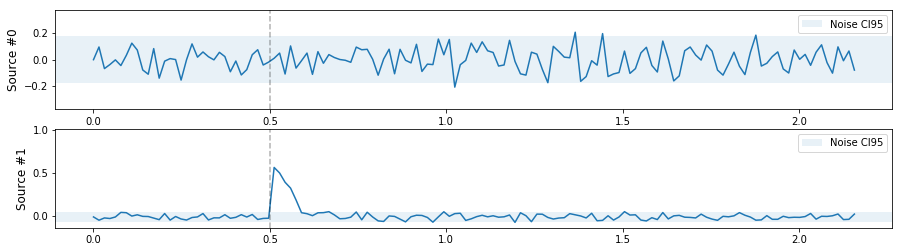

Enter one or more sources number (separate numbers by "," if number of sources > 1): 1


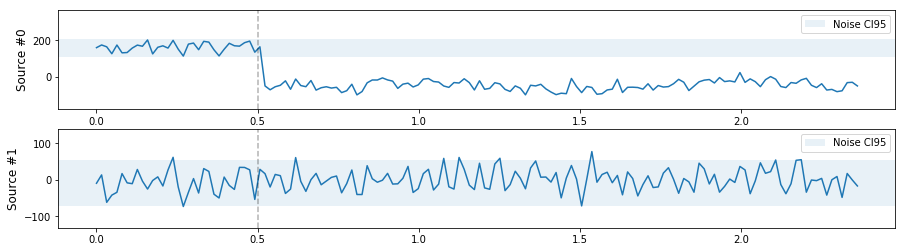

Enter one or more sources number (separate numbers by "," if number of sources > 1): 0


In [59]:
v0path = fpath + '\\video0'
transitory = None

ROIs_mask_0, label_ROIs_0, ROIs_means_filtered_0, time_0, \
ROIs_means_0, ROIs_means_corrected_0, corrections_0, \
mask_list_0, sources_0, selected_source_idx_0, \
t_sig_prop_0, SNR_dB_0 = metroid.metroid(v0path, fr_list[0], transitory)

vmidpath = fpath + '\\videos_AP'
transitory = True
t_sig_onset = 0.5
t_sig_end = 1
n_comp = 2
wavelet = 'dmey'
method = 'ICA'
autoselect = 'manual'

ROIs_mask_AP, label_ROIs_AP, ROIs_means_filtered_AP, time_AP, \
ROIs_means_AP, ROIs_means_corrected_AP, corrections_AP, \
mask_list_AP, sources_AP, selected_source_idx_AP, \
t_sig_prop_AP, SNR_dB_AP = metroid.metroid(vmidpath, fr_list[1:-1], transitory,
                                                                  t_sig_onset,t_sig_end,
                                                                   method,n_comp,wavelet,autoselect)


vlastpath = fpath + '\\video_EP'
transitory = False
t_sig_onset = 0.5
t_sig_end = None
n_comp = 2
wavelet = 'Haar'
method = 'wPCA'
autoselect = 'manual'

ROIs_mask_EP, label_ROIs_EP, ROIs_means_filtered_EP, time_EP, \
ROIs_means_EP, ROIs_means_corrected_EP, corrections_EP, \
mask_list_EP, sources_EP, selected_source_idx_EP, \
t_sig_prop_EP, SNR_dB_EP = metroid.metroid(vlastpath, fr_list[-1],transitory,
                                                                  t_sig_onset,t_sig_end,
                                                                   method,n_comp,wavelet,autoselect)



                                                

## Plot the results:
### 1. Video0

In [60]:
nregions = np.amax(label_ROIs_0).astype(int)
ncolors = nregions
from matplotlib import cm
from matplotlib.colors import ListedColormap
brg = cm.get_cmap('brg', nregions)
newcolors = np.tile((np.arange(0,ncolors))/(ncolors-1),nregions//(ncolors-1))
newcolors = newcolors[:nregions]
newcolors = brg(newcolors)
black = np.array([0, 0, 0, 1])
newcolors = np.insert(newcolors,0,black,axis=0)
newcmp = ListedColormap(newcolors)

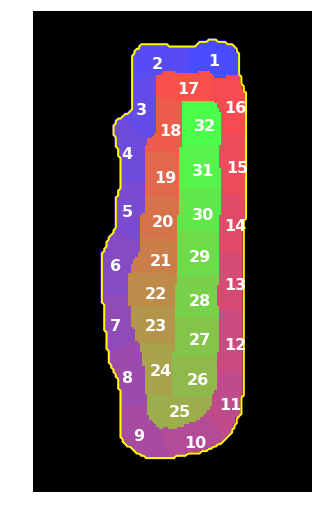

In [61]:
fig, ax = plt.subplots(figsize=[5,10],nrows=1, ncols=1)
ax.imshow(label_ROIs_0, cmap=newcmp)

cent_coord = np.zeros((nregions,2))
fontsize=16
for j in range(nregions):
#     a = np.zeros_like(label_ROIs).astype(bool)
#     a[ROIs_means==j+1] = True
    cent_coord[j,:] = np.rint(mes.get_centroid(ROIs_mask_0[j,:,:]))
    offset = -fontsize//2
    ax.annotate(j+1,(cent_coord[j,0],cent_coord[j,1]),xycoords='data',xytext=(offset, offset),
                textcoords='offset points',color='white',fontsize=fontsize,weight='bold')
ax.axis('off')
contour = mes.build_contour(mask_list_0[0])
ax.imshow(mask_list_0[0],cmap='gray',alpha=0.3)
ax.plot(contour[:,1],contour[:,0],color='yellow',lw=2)


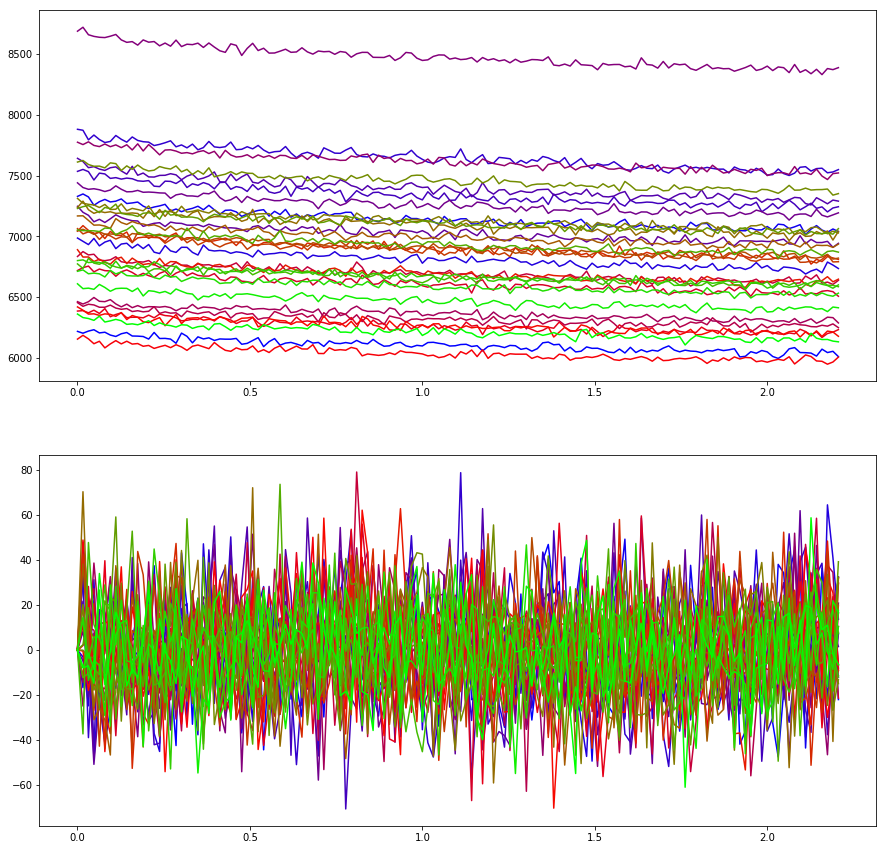

In [62]:
fig, ax = plt.subplots(nrows=2,ncols=1,figsize=[15,15])
for j in range(ROIs_mask_0.shape[0]):
    ax[0].plot(time_0,ROIs_means_0[:,j],color=newcolors[j+1,:])
    ax[1].plot(time_0,ROIs_means_corrected_0[:,j],color=newcolors[j+1,:])

### 2. Videos_AP

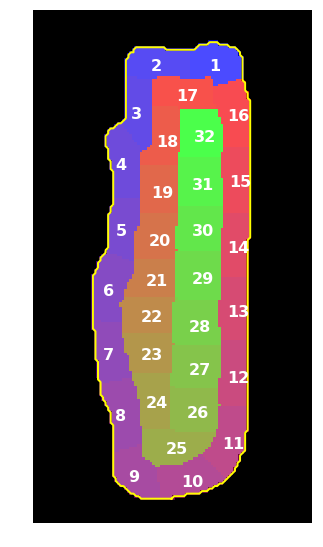

In [63]:
fig, ax = plt.subplots(figsize=[5,10],nrows=1, ncols=1)
ax.imshow(label_ROIs_AP, cmap=newcmp)

cent_coord = np.zeros((nregions,2))
fontsize=16
for j in range(nregions):
#     a = np.zeros_like(label_ROIs).astype(bool)
#     a[ROIs_means==j+1] = True
    cent_coord[j,:] = np.rint(mes.get_centroid(ROIs_mask_AP[j,:,:]))
    offset = -fontsize//2
    ax.annotate(j+1,(cent_coord[j,0],cent_coord[j,1]),xycoords='data',xytext=(offset, offset),
                textcoords='offset points',color='white',fontsize=fontsize,weight='bold')
ax.axis('off')
contour = mes.build_contour(mask_list_AP[0])
ax.imshow(mask_list_AP[0],cmap='gray',alpha=0.3)
ax.plot(contour[:,1],contour[:,0],color='yellow',lw=2)

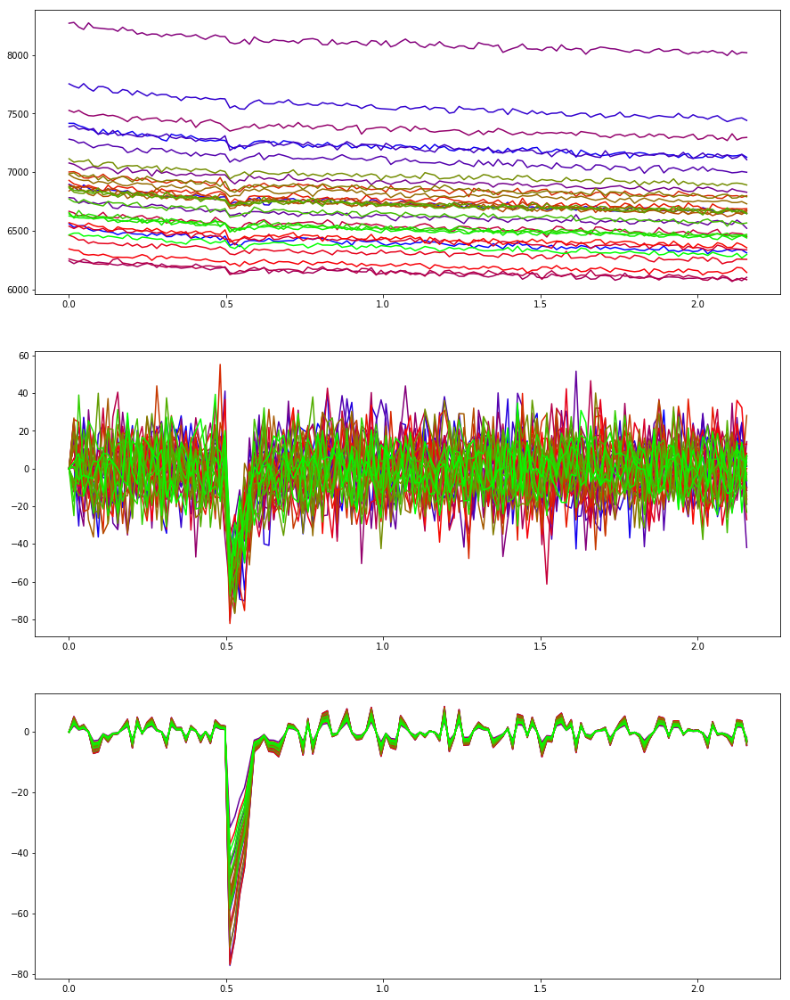

In [64]:
fig, ax = plt.subplots(nrows=3,ncols=1,figsize=[15,20])
for j in range(ROIs_mask_AP.shape[0]):
    ax[0].plot(time_AP,ROIs_means_AP[:,j],color=newcolors[j+1,:])
    ax[1].plot(time_AP,ROIs_means_corrected_AP[:,j],color=newcolors[j+1,:])
    ax[2].plot(time_AP,ROIs_means_filtered_AP[:,j],color=newcolors[j+1,:])

In [65]:
print('Signal onset time:',t_sig_prop_AP[0],'s')
print('Signal end time:',t_sig_prop_AP[1],'s')
print('Signal-to-Noise Ratio per ROI:\n',SNR_dB_AP,'dB')

Signal onset time: 0.5 s
Signal end time: 1 s
Signal-to-Noise Ratio per ROI:
 [ -3.75  -4.13  -5.75  -2.62  -3.66  -6.74 -10.72  -6.02  -8.66  -5.07
  -5.03  -6.07  -5.4   -5.56  -5.27  -8.5   -5.36  -3.32  -6.11  -5.13
  -4.19  -6.27  -3.84  -3.19  -6.6   -4.58  -5.64  -4.07  -4.51  -4.71
  -5.49  -6.91] dB


### 3. Video_EP

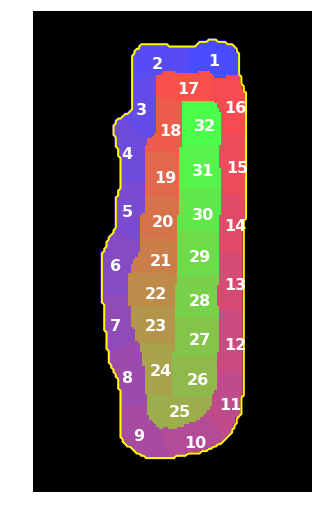

In [66]:
fig, ax = plt.subplots(figsize=[5,10],nrows=1, ncols=1)
ax.imshow(label_ROIs_EP, cmap=newcmp)

cent_coord = np.zeros((nregions,2))
fontsize=16
for j in range(nregions):
#     a = np.zeros_like(label_ROIs).astype(bool)
#     a[ROIs_means==j+1] = True
    cent_coord[j,:] = np.rint(mes.get_centroid(ROIs_mask_EP[j,:,:]))
    offset = -fontsize//2
    ax.annotate(j+1,(cent_coord[j,0],cent_coord[j,1]),xycoords='data',xytext=(offset, offset),
                textcoords='offset points',color='white',fontsize=fontsize,weight='bold')
ax.axis('off')
contour = mes.build_contour(mask_list_EP[0])
ax.imshow(mask_list_EP[0],cmap='gray',alpha=0.3)
ax.plot(contour[:,1],contour[:,0],color='yellow',lw=2)


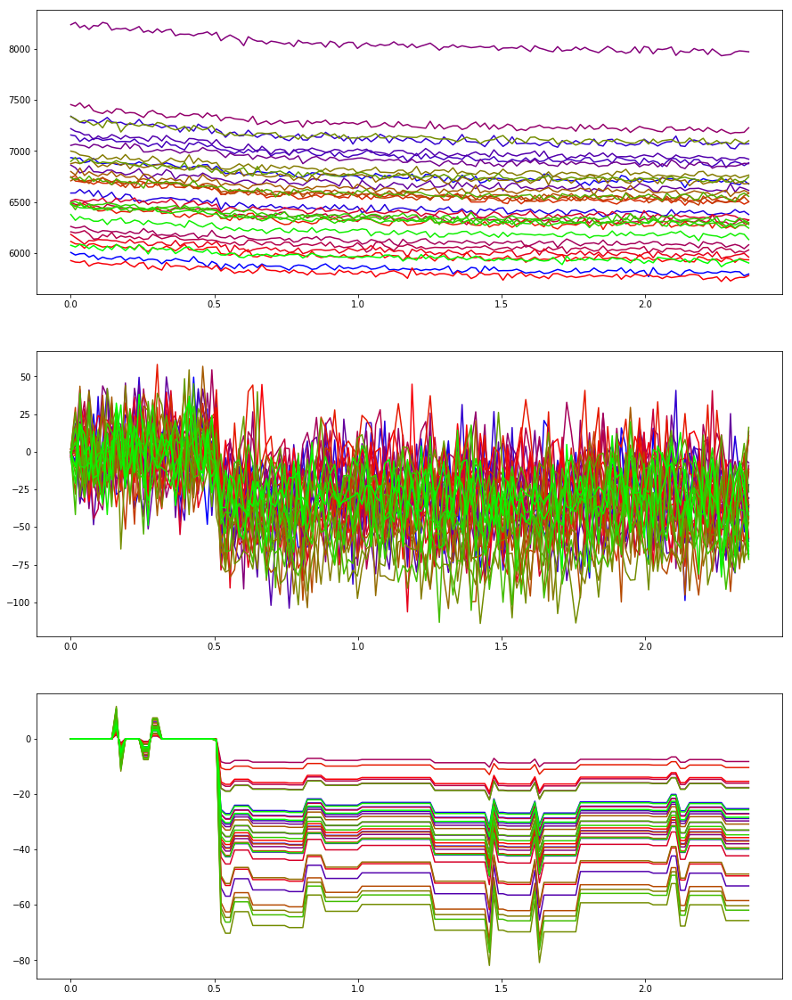

In [67]:
fig, ax = plt.subplots(nrows=3,ncols=1,figsize=[15,20])
for j in range(ROIs_mask_EP.shape[0]):
    ax[0].plot(time_EP,ROIs_means_EP[:,j],color=newcolors[j+1,:])
    ax[1].plot(time_EP,ROIs_means_corrected_EP[:,j],color=newcolors[j+1,:])
    ax[2].plot(time_EP,ROIs_means_filtered_EP[:,j],color=newcolors[j+1,:])

In [68]:
print('Signal onset time:',t_sig_prop_EP[0],'s')
print('Signal end time:',t_sig_prop_EP[1],'s')
print('Signal-to-Noise Ratio per ROI:\n',SNR_dB_EP,'dB')

Signal onset time: 0.5 s
Signal end time: None s
Signal-to-Noise Ratio per ROI:
 [ 3.98  7.   -0.4   4.77  1.88  7.09  1.09  2.55  3.65 -3.57 -6.87 -3.3
  4.68  5.23  7.59 -3.13  4.59 -7.51  5.49  3.91  8.29  1.41  7.34  9.21
  7.39 -1.42  2.96  9.72  6.07  7.94  2.14  1.  ] dB


## Signal Properties

### Calculate AP properties

(0.5, 1)
(140, 1)
[-0.02]
0.5788652724151873
APD25= 46.547711404189286 ms
APD75= 77.57951900698218 ms


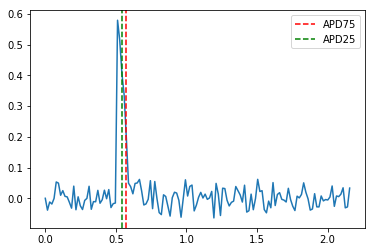

In [69]:
print(t_sig_prop_AP)
#Get signal onset and end indices
t_sig_onset_idx = np.argmin(abs(time_AP - t_sig_prop_AP[0]))
if t_sig_prop_AP[1] is not None:
    t_sig_end_idx = np.argmin(abs(time_AP - t_sig_prop_AP[1]))

#Get selected source and makes signal positive
source = sources_AP[:,selected_source_idx_AP]
print(source.shape)
if (abs(source.min()))>(abs(source.max())):
    source = -source
#Get source base value from innactive interval
if t_sig_prop_AP[1] is not None:
    base = np.median(np.concatenate((source[:t_sig_onset_idx],source[t_sig_end_idx:])),axis=0)
else:
    base = np.median(source[:t_sig_onset_idx])
#Get AP signal peak and peak index
peak = np.amax(source-base)
peakidx = np.argmax(source-base)


print(base)
print(peak)
peak25 = 0.25*peak
peak75 = 0.75*peak

if t_sig_prop_AP[1] is not None:
    idx = (np.abs(source[peakidx:t_sig_end_idx] - peak75)).argmin()
else:
    idx = (np.abs(source[peakidx:] - peak75)).argmin()
idxAPD25 = idx+peakidx

APD25 = (time_AP[idxAPD25] - time_AP[t_sig_onset_idx])*1000
print('APD25=',APD25,'ms')

if t_sig_prop_AP[1] is not None:
    idx = (np.abs(source[peakidx:t_sig_end_idx] - peak25)).argmin()
else:
    idx = (np.abs(source[peakidx:] - peak25)).argmin()
idxAPD75 = idx+peakidx

APD75 = (time_AP[idxAPD75] - time_AP[t_sig_onset_idx])*1000
print('APD75=',APD75,'ms')

plt.plot(time_AP,source-base)
plt.axvline(x=time_AP[idxAPD75],ls='--',label='APD75',color='r')
plt.axvline(x=time_AP[idxAPD25],ls='--',label='APD25',color='g')
plt.legend()

### Estimated SNR

(array([-12.5, -10. ,  -7.5,  -5. ,  -2.5,   0. ,   2.5,   5. ,   7.5,
         10. ,  12.5]), <a list of 11 Text yticklabel objects>)

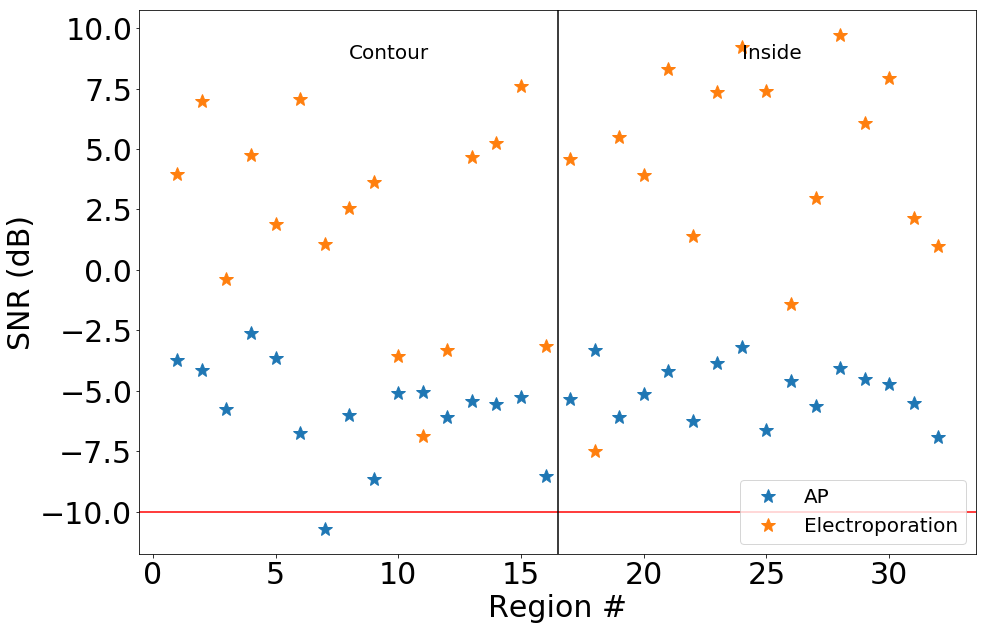

In [70]:
plt.figure(figsize=[15,10])
plt.plot(np.arange(1,nregions+1),SNR_dB_AP,'*',label='AP',ms=15)
plt.plot(np.arange(1,nregions+1),SNR_dB_EP,'*',label='Electroporation',ms=15)
# plt.title('SNR vs region')
plt.xlabel('Region #',fontsize=30)
plt.ylabel('SNR (dB)',fontsize=30)
# plt.axvspan(0, n_regions//4, facecolor='#2ca02c', alpha=0.5)
# plt.axvspan(n_regions//4, 3*(n_regions//4), facecolor='0.2', alpha=0.5)
# plt.axvspan(3*(n_regions//4), n_regions, facecolor='#2ca02c', alpha=0.5)
# plt.axvspan(n_regions, n_regions+n_regions_inside//4, facecolor='#2ca02c', alpha=0.5)
# plt.axvspan(n_regions+n_regions_inside//4, n_regions+3*(n_regions_inside//4), facecolor='0.2', alpha=0.5)
# plt.axvspan(n_regions+3*(n_regions_inside//4), n_regions+n_regions_inside, facecolor='#2ca02c', alpha=0.5)
# plt.axhspan(-20, -10, facecolor='r', alpha=0.5)
plt.axhline(y=-10, color='r')
# plt.axvline(x=12,color='r')
plt.axvline(x=nregions//2+0.5,color='k')
# plt.axvline(x=24,color='r')
# plt.axvline(x=32,color='r')
plt.annotate('Contour',(nregions//4,0.9*(np.amax([np.amax(SNR_dB_EP),np.amax(SNR_dB_AP)]))),fontsize=20)
# plt.annotate('Cathode contour',(1+n_regions//2,0.9*(np.amax([np.amax(SNR[1]),np.amax(SNR[0])]))),fontsize=20)
plt.annotate('Inside',(nregions//2+(nregions//4),0.9*(np.amax([np.amax(SNR_dB_EP),np.amax(SNR_dB_AP)]))),fontsize=20)
# plt.annotate('Cathode inside',(1+n_regions+n_regions_inside//2,0.9*(np.amax([np.amax(SNR[1]),np.amax(SNR[0])]))),fontsize=20)
plt.legend(fontsize=20,loc=4)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
# imname0 = fpath + 'SNR vs region' + '.png'
# plt.savefig(imname0,bbox_inches='tight')

### Noise Reduction Calculation

In [71]:
if t_sig_prop_AP[1] is None:
    innactive_mask_AP = ((time_AP>0) & (time_AP<t_sig_prop_AP[0]-0.1))
else:
    innactive_mask_AP = ((time_AP>0) & (time_AP<t_sig_prop_AP[0]-0.1)) | ((time_AP>t_sig_prop_AP[1]))
noise_AP = bssd.get_noise_power(ROIs_means_corrected_AP,time_AP,innactive_mask_AP)
noise_AP_filt = bssd.get_noise_power(ROIs_means_filtered_AP,time_AP,innactive_mask_AP)
active_mask_AP = np.invert(innactive_mask_AP)


AP_noise_Reduction = noise_AP_filt/noise_AP
AP_noise_Reduction_mean = np.mean((1-AP_noise_Reduction)*100)
np.set_printoptions(precision=2)
print('AP mean noise reduction:',AP_noise_Reduction_mean,'%')

AP mean noise reduction: 96.5051683245329 %


In [72]:
innactive_mask_EP = ((time_EP>0) & (time_EP<t_sig_prop_EP[0]-0.1))
active_mask_EP = np.invert(innactive_mask_EP)
noise_EP = bssd.get_noise_power(ROIs_means_corrected_EP,time_EP,innactive_mask_EP)
noise_EP_filt = bssd.get_noise_power(ROIs_means_filtered_EP,time_EP,innactive_mask_EP)



EP_noise_Reduction = noise_EP_filt/noise_EP
EP_noise_Reduction_mean = np.mean((1-EP_noise_Reduction)*100)
np.set_printoptions(precision=2)
print('Electroporation mean noise reduction:',EP_noise_Reduction_mean,'%')

Electroporation mean noise reduction: 98.06729378230534 %


## Calibration

In [73]:
AP_amplitude = 120
Resting = -80

In [74]:
# APbaselinefilt2 = np.median(np.concatenate((X_estfilt[:idx_0_5sec,:],X_estfilt[idx_1sec:,:])),axis=0)
# APbaselinefilt = np.median(X_estfilt[:idx_0_5sec,:],axis=0)
# print(APbaselinefilt)
# print(APbaselinefilt2-APbaselinefilt)
# APbaseline = np.median(X_est[:idx_0_5sec,:],axis=0)
# APbaseline2 = np.median(np.concatenate((X_est[:idx_0_5sec,:],X_est[idx_1sec:,:])),axis=0)
# print(APbaseline)
# print(APbaseline2-APbaseline)
# APbaselineRAW = np.median(Xest[:idx_0_5sec,:],axis=0)
# APbaselineRAW2 = np.median(np.concatenate((Xest[:idx_0_5sec,:],Xest[idx_1sec:,:])),axis=0)
# print(APbaselineRAW)
# print(APbaselineRAW2-APbaselineRAW)

In [75]:
# Shockbaselinefilt = np.median(X_choque1filt[:idx_2_5sec-3,:],axis=0)
# print(Shockbaselinefilt)
# Shockbaseline = np.median(X_choque1[:idx_2_5sec-3,:],axis=0)
# print(Shockbaseline)
# ShockbaselineRAW = np.median(Xchoque[:idx_2_5sec-3,:],axis=0)
# print(ShockbaselineRAW)

In [76]:
AP_max = np.amax(abs(ROIs_means_corrected_AP),axis=0)
AP_filtered_max = np.amax(abs(ROIs_means_filtered_AP),axis=0)

print('AP_max = ',AP_max)
print('AP_filtered_max = ',AP_filtered_max)

AP_max =  [68.41 67.63 50.16 70.14 80.66 60.29 51.71 63.89 46.71 64.97 44.77 58.98
 62.54 76.46 56.37 47.66 65.57 82.23 59.18 63.34 72.81 56.31 60.68 76.95
 67.75 61.62 53.03 66.73 70.9  62.48 60.38 49.85]
AP_filtered_max =  [59.09 71.   48.18 77.12 75.56 55.33 31.54 44.33 42.87 55.28 49.03 52.17
 63.7  53.24 52.63 37.09 57.9  76.81 53.87 55.58 65.72 53.59 52.69 71.1
 48.75 56.75 47.48 56.63 58.31 47.04 42.99 39.46]


In [77]:
# APfilt = np.zeros_like(X_estfilt)
AP_filt = ((-(ROIs_means_filtered_AP)/AP_filtered_max)*AP_amplitude)+Resting
# AP = np.zeros_like(X_est)
AP = ((-(ROIs_means_corrected_AP)/AP_max)*AP_amplitude)+Resting
# APRAW = np.zeros_like(Xest)
# APRAW = ((-(Xest-APbaselineRAW2)/Xest_max)*AP_amplitude)+Resting

In [78]:
EP_filt = ((-(ROIs_means_filtered_EP)/AP_filtered_max)*AP_amplitude)+Resting
# Shock_ = ((-(X_choque1-Shockbaseline)/X_est_max[:len(X_est_max)])*AP_amplitude)+Resting
EP = ((-(ROIs_means_corrected_EP)/AP_filtered_max)*AP_amplitude)+Resting

In [79]:
# idx_2_5sec = np.argwhere(np.floor(time3[-1]-1.5).clip(min=0))[0][0]
# idx_2_55sec = np.argwhere(np.floor(time3[-1]-1.55).clip(min=0))[0][0]
# steady_filt = np.median(Shock_filt[idx_2_5sec:,:],axis=0)
# print('steady filt =',steady_filt,'mV')
# steady_ = np.median(Shock_[idx_2_5sec:,:],axis=0)
# print('steady  =',steady_,'mV')

# peak_filt = np.amax(Shock_filt[idx_2_5sec-1:idx_2_55sec,:],axis=0)
# print('peak_filt = ',peak_filt)
# peak_ = np.amax(Shock_[idx_2_5sec-1:idx_2_55sec,:],axis=0)
# print('peak_ = ',peak_)
# print(time3[-1][idx_2_5sec])

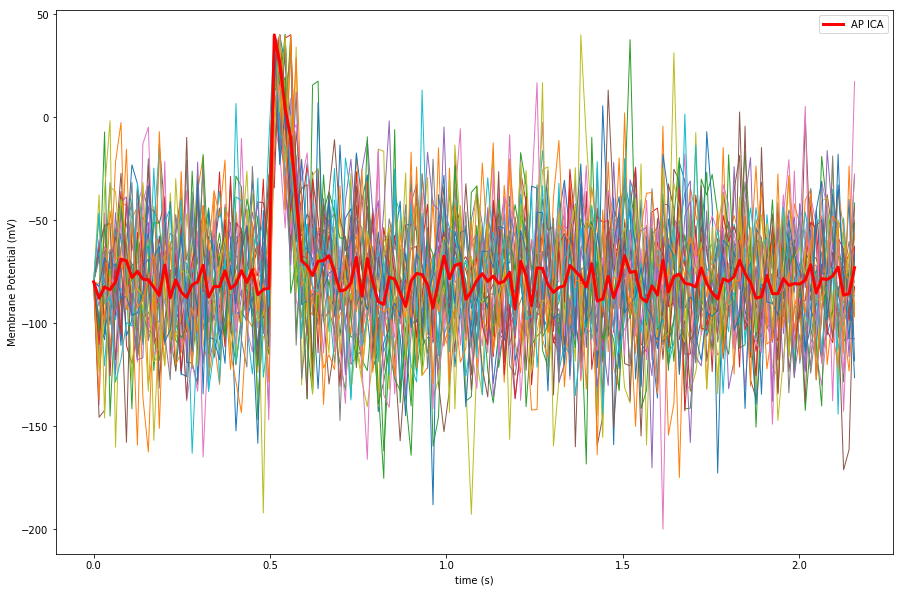

In [80]:
plt.figure(figsize=[15,10])
plt.plot(time_AP,AP,linewidth=1)
plt.plot(time_AP,AP_filt[:,0],linewidth=3,color='red',label = 'AP ICA')
# plt.plot(time3[-2],AP[:,0],linewidth=3,color='orange', label = 'AP ICA')
plt.xlabel('time (s)')
plt.ylabel('Membrane Potential (mV)')
plt.legend()
# graph_AP = fpath + 'graphAP' + '.png'
# plt.savefig(graph_AP,bbox_inches='tight')

C:\Users\Marcelo\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


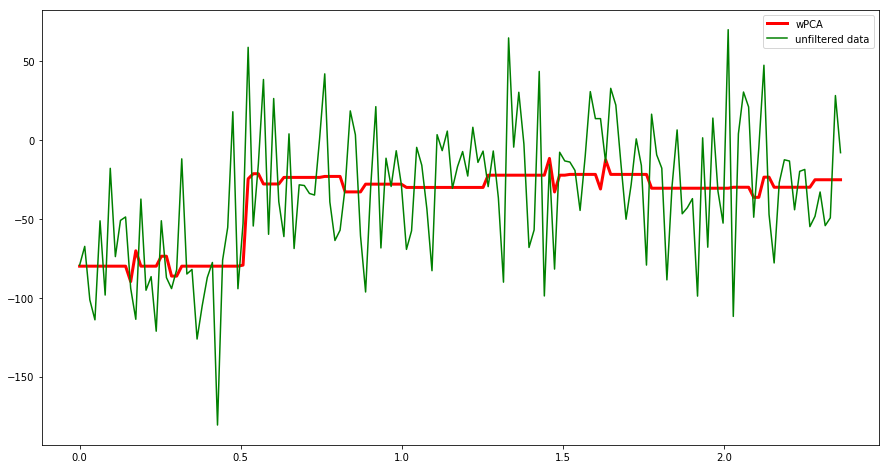

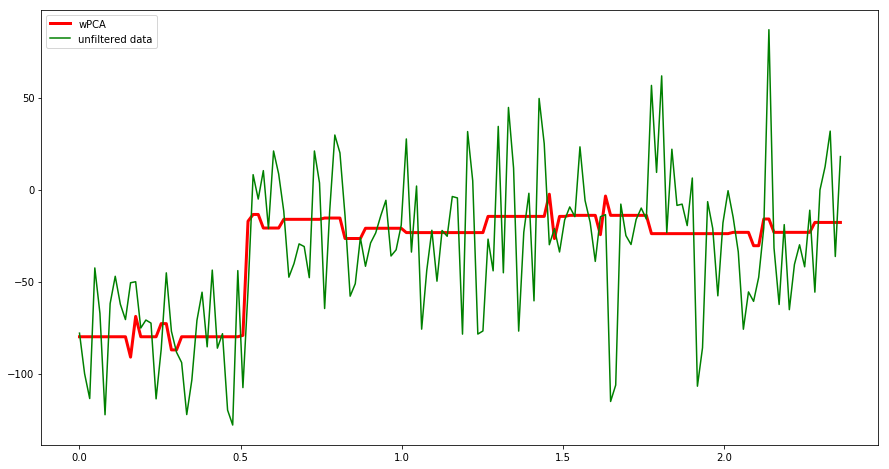

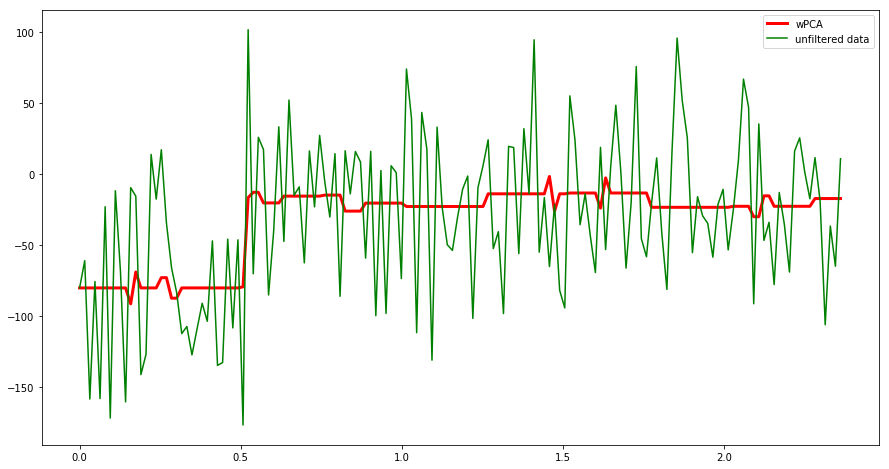

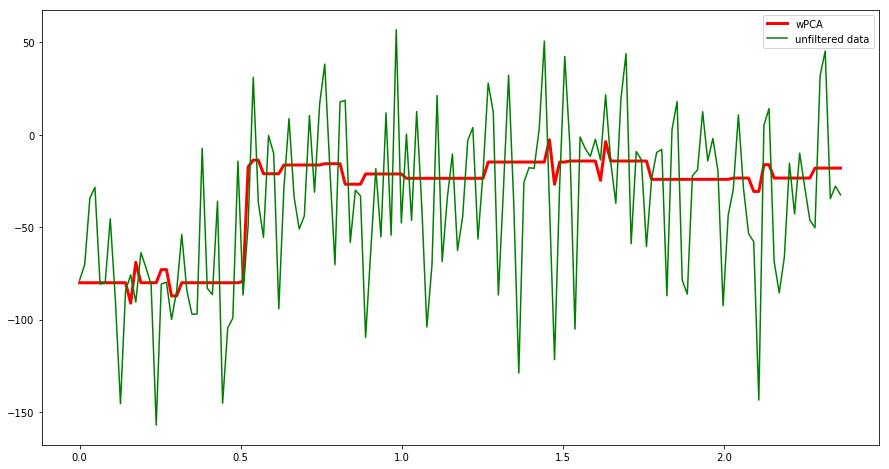

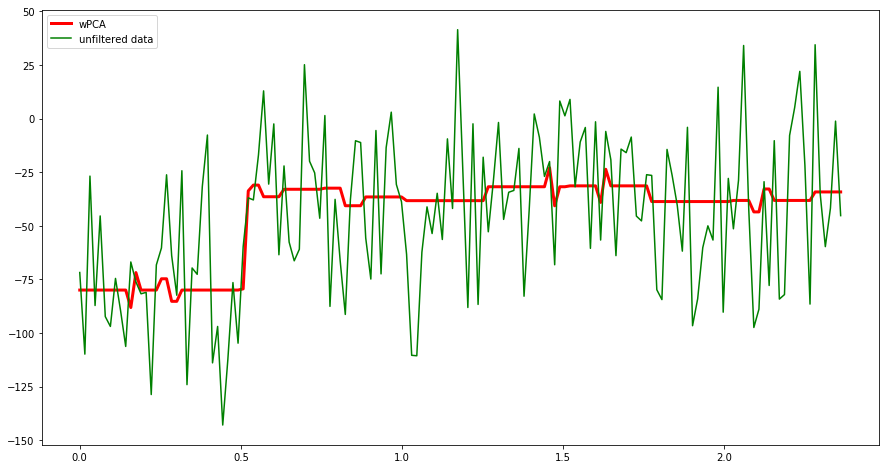

...

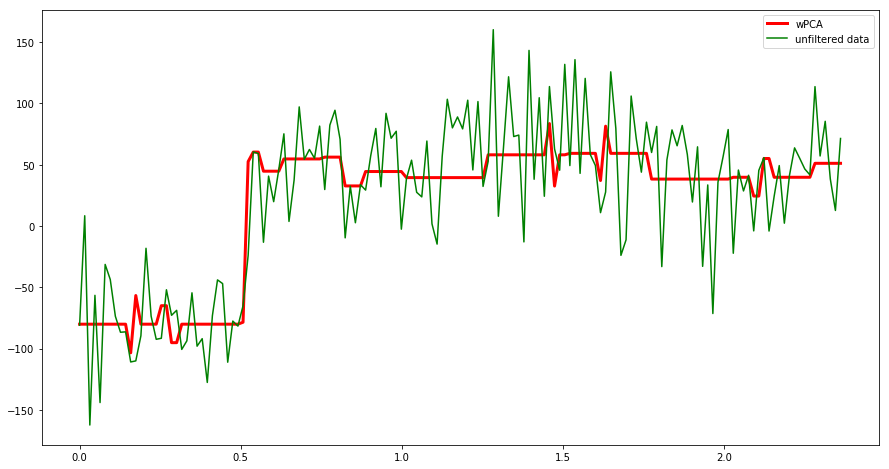

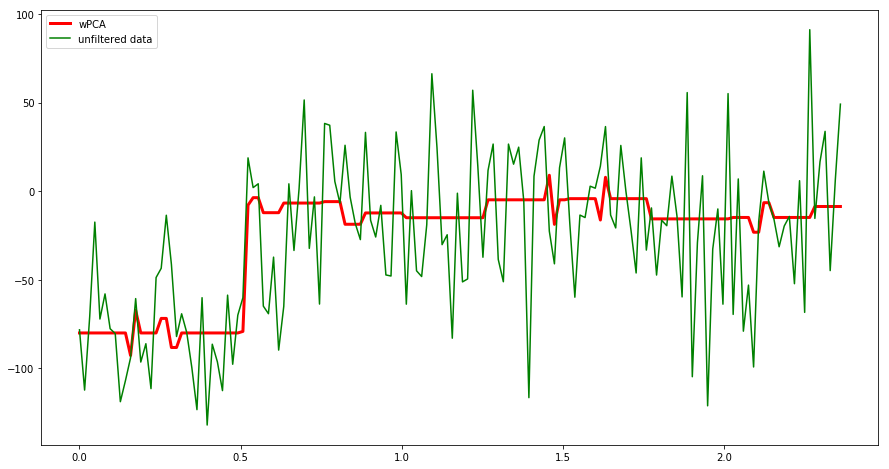

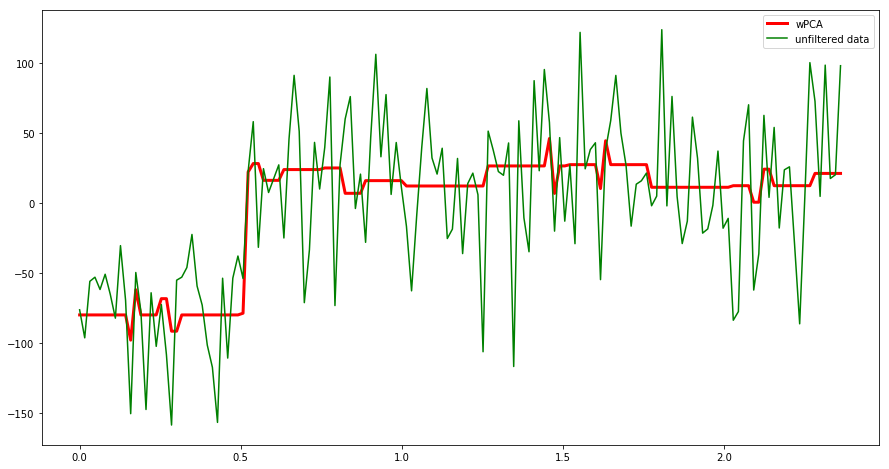

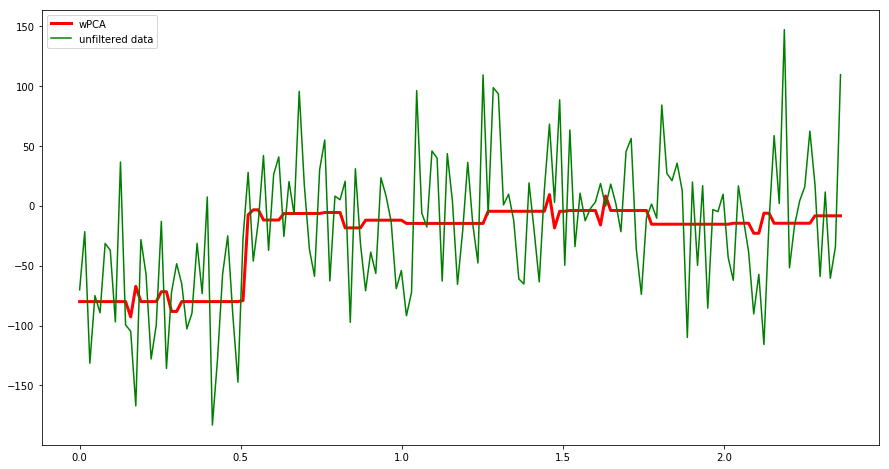

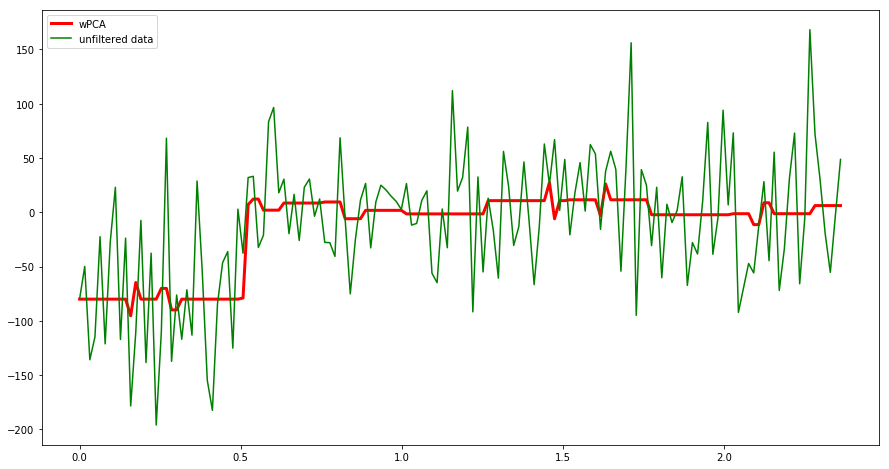

In [81]:
ymin = np.amin(ROIs_means_corrected_EP)
ymax = np.amax(ROIs_means_corrected_EP)
for i in range(nregions):
    plt.figure(figsize=[15,8])
    plt.plot(time_EP,EP_filt[:,i],'r',linewidth=3,label='wPCA')
    plt.plot(time_EP,EP[:,i],color='green',label='unfiltered data')
#     plt.plot(time3[-1],Shock_[:,i],color='orange',linewidth=2,label='PCA')
#     plt.axis([0, time3[-1][-1], ymin, ymax])
    plt.legend()
#     graphA = fpath + 'graphics2/' + 'graphShock' + str(i) + '.png'
#     plt.savefig(graphA,bbox_inches='tight')
#     plt.close()

### Save data

In [82]:
name = 'ROIs_means_'
output_path = fpath + '\\Outputs\\'
ftxtname = output_path + name + 'AP.csv'
fobj = open(ftxtname,mode="w")
fobj.write("time;APfilt;AP\n")

roi_str = 'ROI#'
line=''
for i in range(nregions):
    line = line + roi_str + str(i+1) + ';'
secondline = ';ROI#1;' + line +'\n'
fobj.write(secondline)

# fobj.write("\t;APfilt;AP\n")
# timeout = time_AP
values = AP_filt[:,0]
matrix = np.zeros((len(time_AP),nregions+2))
matrix[:,0] = time_AP
matrix[:,1] = AP_filt[:,0]
matrix[:,2:] = AP

fmt0 = ['%.3f']
for i in range(nregions+1):
    fmt0.append('%.2f')
np.savetxt(fobj, matrix,fmt=fmt0, delimiter=';', newline='\n')

fobj.close()

In [83]:
ftxtname = output_path + name + 'EP.csv'
fobj = open(ftxtname,mode="w")
dotc = ';'
for i in range((nregions)-1):
    dotc = dotc + ';'
firstline = 'time;EPfilt' + dotc + 'EP\n'
fobj.write(firstline)

roi_str = 'ROI#'
line=''
for i in range(nregions):
    line = line + roi_str + str(i+1) + ';'
secondline = ';' + line + line + '\n'
fobj.write(secondline)

# timeout = time3[-1]

matrix = np.zeros((len(time_EP),(2*(nregions))+1))
matrix[:,0] = time_EP
matrix[:,1:(nregions)+1] = EP_filt
matrix[:,(nregions)+1:(2*(nregions))+1] = EP
# matrix[:,(2*(n_regions_total))+1:(3*(n_regions_total))+1] = Shock_RAW
fmt0 = ['%.3f']
for i in range((2*(nregions))):
    fmt0.append('%.2f')
np.savetxt(fobj, matrix,fmt=fmt0, delimiter=';', newline='\n')

fobj.close()

## Plot data

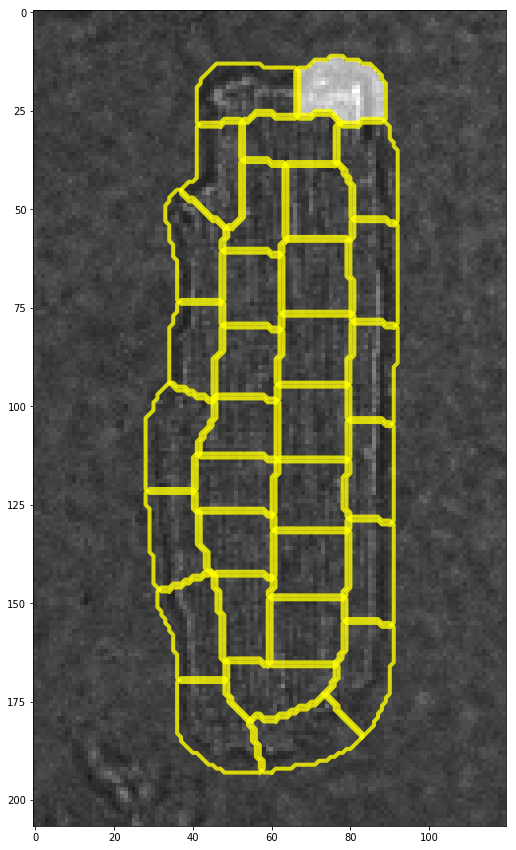

In [84]:
from skimage import io
snap = io.imread(fpath+'\\snap.tif')
plt.figure(figsize=[25,15])
plt.imshow(snap,cmap='gray',vmin=0,vmax=np.amax(snap))
contour = np.zeros_like(label_ROIs_EP,bool)
for i in range(nregions):
    contour = mes.build_contour(ROIs_mask_EP[i])
    plt.plot(contour[:,1],contour[:,0],color='yellow',lw=4,alpha=0.8)
plt.imshow(ROIs_mask_EP[0],cmap='gray',alpha=0.5)

C:\Users\Marcelo\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


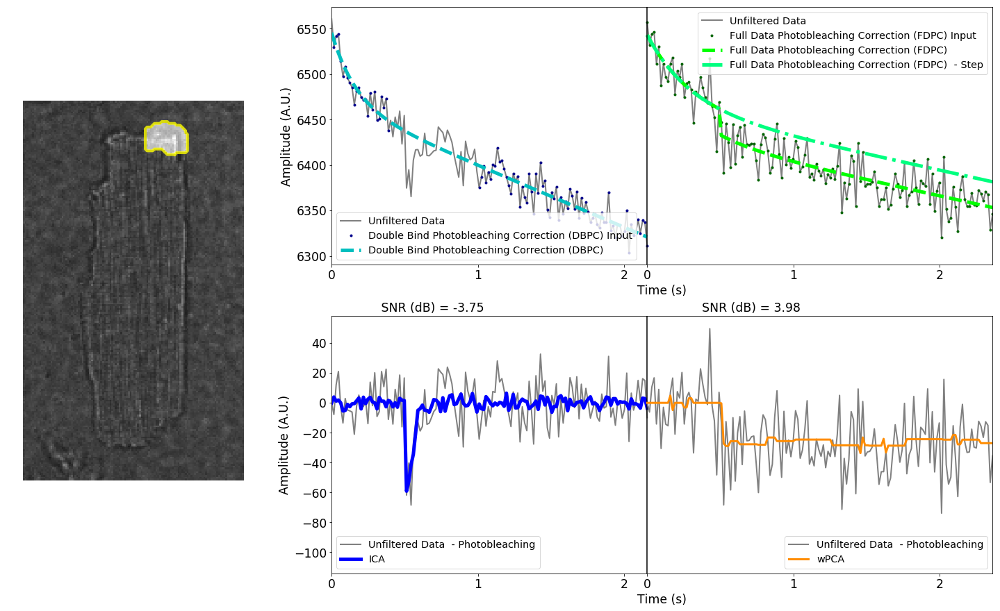

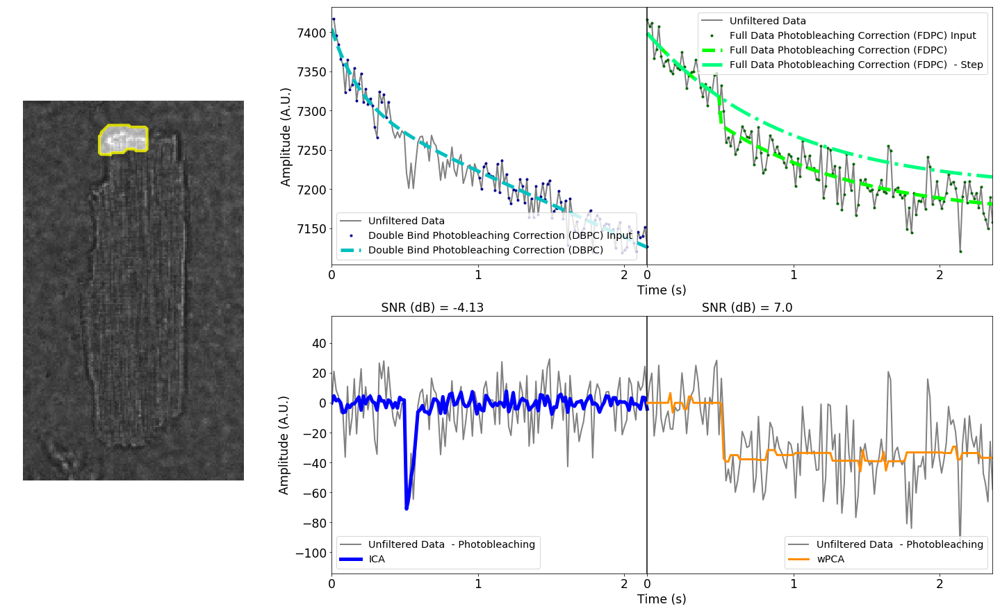

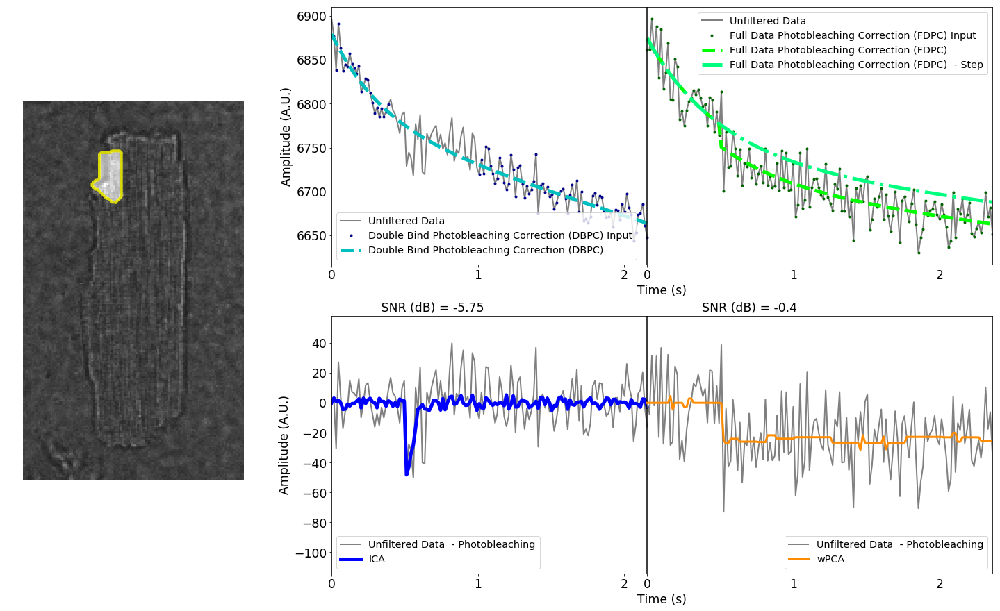

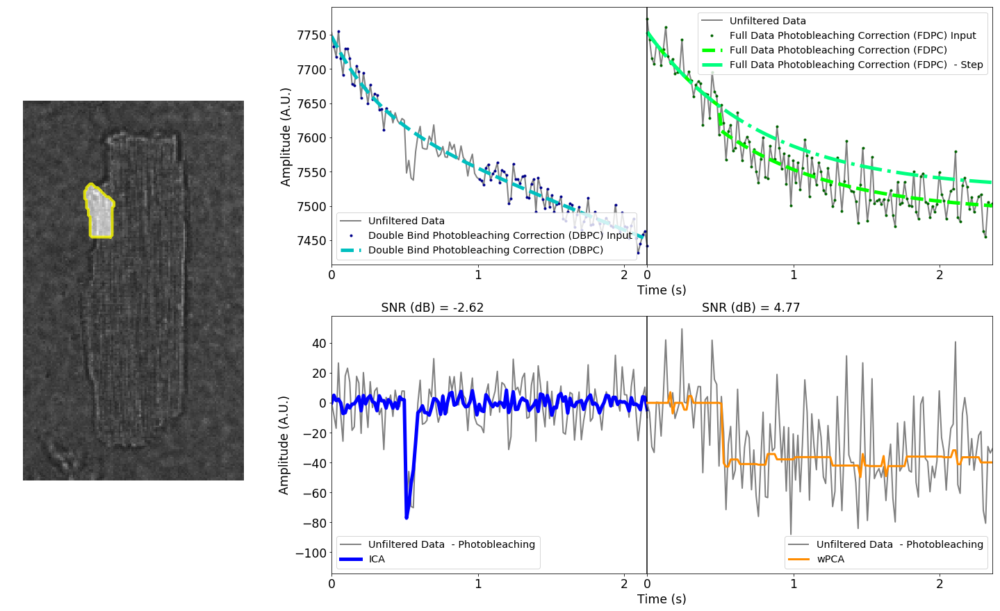

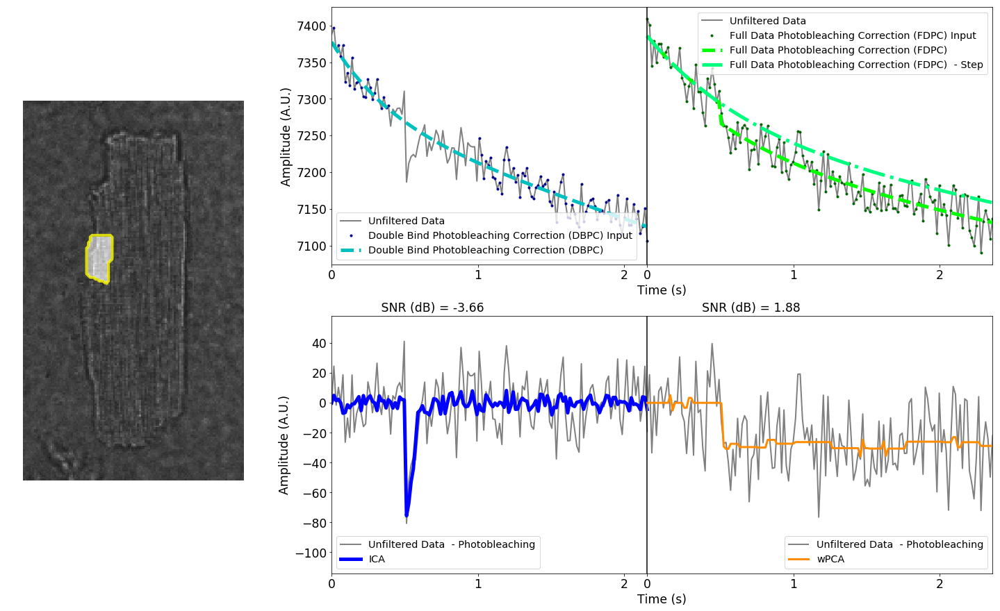

...

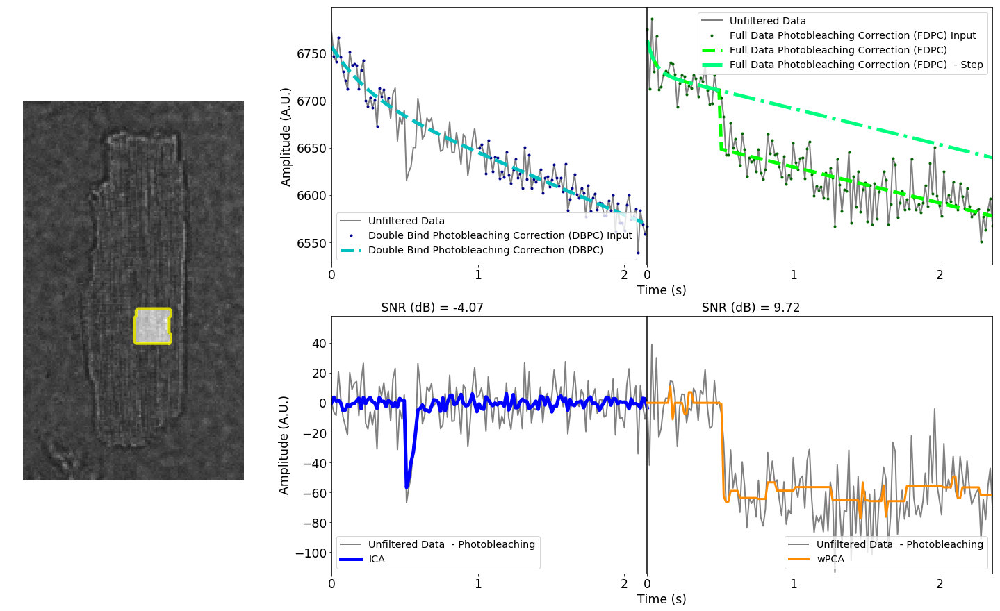

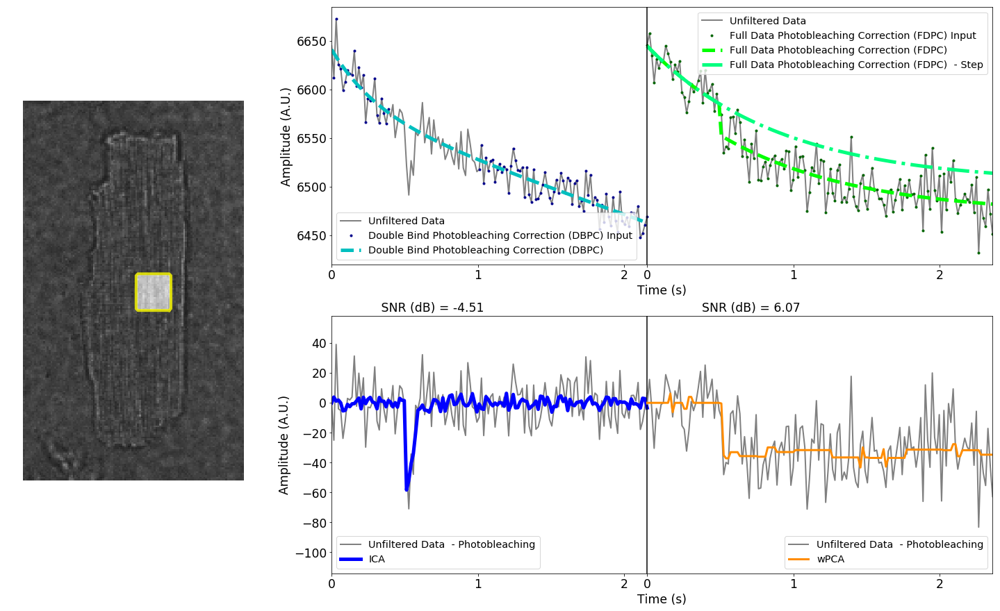

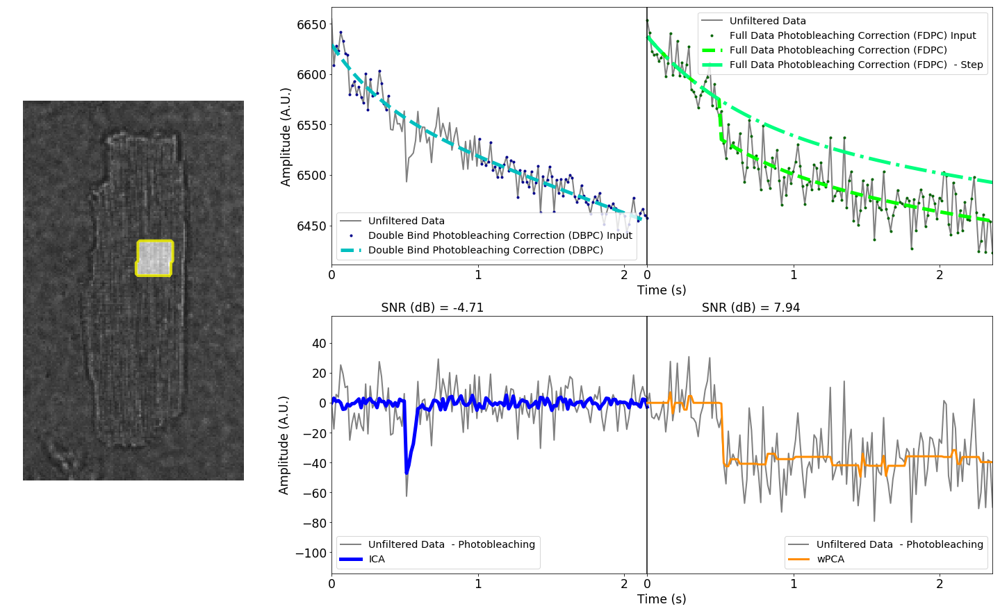

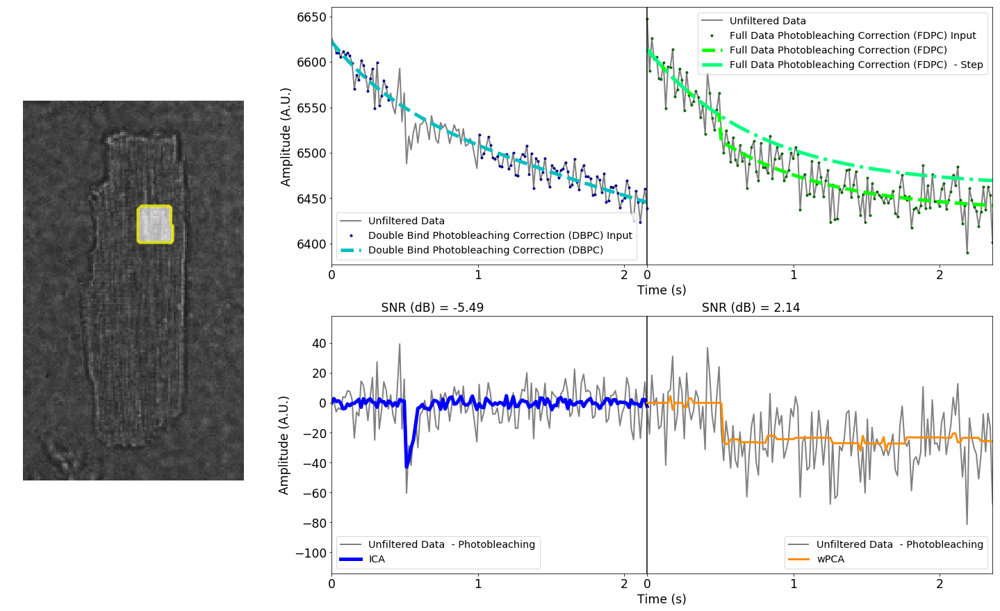

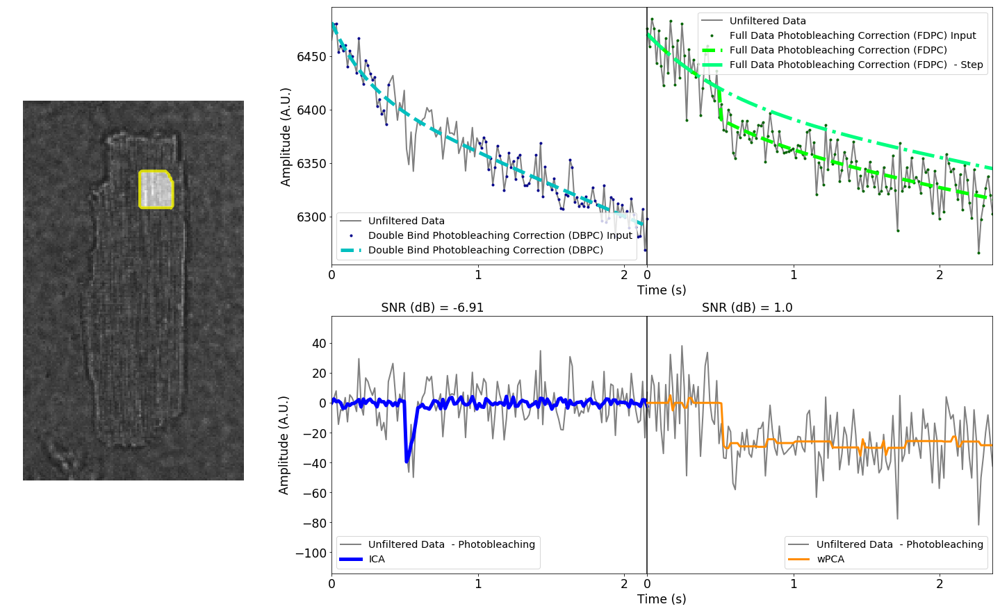

In [85]:
# fpath3 = fpath + 'graphics3/'
ymin = np.amin(ROIs_means_corrected_EP)
ymax = np.amax(ROIs_means_corrected_EP)
from scipy.optimize import curve_fit
for i in range(nregions): 

    plt.figure(figsize=[25,15])
    import matplotlib.gridspec as gridspec
    gs = gridspec.GridSpec(2, 2,
                           width_ratios=[1, 3],
                           height_ratios=[1, 1]
                           )
    ax1 = plt.subplot(gs[0:,0])
    # plt.subplot(121)
    snap = io.imread(fpath+'\\snap.tif')
    plt.imshow(snap,cmap='gray',vmin=0,vmax=np.amax(snap))
    contour = np.zeros_like(label_ROIs_EP,bool)
#     for j in range(nregions):
    contour = mes.build_contour(ROIs_mask_EP[i])
    plt.plot(contour[:,1],contour[:,0],color='yellow',lw=4,alpha=0.8)
    plt.imshow(ROIs_mask_EP[i],cmap='gray',alpha=0.5)
    ax1.axis('off')
    ##################################################################################
    ax2 = plt.subplot(gs[1])
    '''PLOT AP'''
    ax2.plot(time_AP,ROIs_means_AP[:,i],'-',color='gray',lw=2,label='Unfiltered Data')
    photobleaching = ROIs_means_AP[innactive_mask_AP,i]
    time_photob = time_AP[innactive_mask_AP]
    plt.plot(time_photob,photobleaching,'.',ms=6,color='darkblue',
             label='Double Bind Photobleaching Correction (DBPC) Input')

    y0 = np.mean(photobleaching[:5])
    yf = np.mean(photobleaching[-5:])
    #FIT #0:    linear fit
    c, d = np.polyfit(time_photob,photobleaching,1)
    p = np.poly1d([c,d])

     #FIT #3:    monoexp and line fit
    upper_bounds = [2*(y0-yf), 2*(np.log(d-(c*yf)-c)-np.log(y0-yf)), 2*(abs(c)), 2*yf]
    popt2, pcov2 = curve_fit(rpb.monoexp_and_line, time_AP[innactive_mask_AP], photobleaching, bounds=(0, upper_bounds))
    res_expline = photobleaching - rpb.monoexp_and_line(time_AP[innactive_mask_AP], *popt2)
    total_res_expline = np.sum(abs(res_expline**2))/len(photobleaching)

    #If any fit parameter gets close to its respective upper_boundary, expand upper_boundaries and retries fit   
    if np.all(np.greater(upper_bounds,popt2+0.01*(popt2)))==False:
        clip_flag = 1
#                 print('WARNING: Data clipped by upper bound at region %d, monoexp and linear fit'% j)
        while(clip_flag==1):
            close = np.isclose(upper_bounds,popt2,atol=1e-02)
            if np.any(close)==False:  #if can't identify which parameter is clipped, duplicate all
                upper_bounds = np.multiply(2,upper_bounds)
            else:                     #if clipped parameter is identified, duplicate it
                closeidx = np.argwhere(close)[0][0]
                upper_bounds[closeidx] = np.multiply(2,upper_bounds[closeidx])
#                     print('Expanding upper bounds!')
            popt2, pcov2 = curve_fit(rpb.monoexp_and_line, time_AP[innactive_mask_AP], photobleaching, bounds=(0, upper_bounds))
            res_expline = photobleaching - rpb.monoexp_and_line(time_AP[innactive_mask_AP], *popt2)
            total_res_expline = np.sum(abs(res_expline**2))/len(photobleaching)
#                         if cnt==3:
#                             res_expline = m[:,j] - monoexp_and_line(t, *popt2)
#                             total_res_expline = np.sum(abs(res_expline**2))/len(m[:,j])
            if np.all(np.greater(upper_bounds,popt2+0.01*(popt2)))==True:
                clip_flag = 0
            #Breaks if either exponential coefficient or linear coefficients overflow
            if (popt2[0]+popt2[3]>1.2*y0)|(popt2[1]<0.05):
                break
    plt.plot(time_AP, rpb.monoexp_and_line(time_AP, *popt2), 'c--',lw=5, 
             label='Double Bind Photobleaching Correction (DBPC)')
    # Create a legend for the first line.
    first_legend = plt.legend(loc='lower left',fontsize='x-large')

    # Add the legend manually to the current Axes.
    ax2 = plt.gca().add_artist(first_legend)

    '''PLOT SHOCK''' 
    disp = np.mean(ROIs_means_EP[0:5,i])-np.mean(ROIs_means_AP[0:5,i])
    curve1, = plt.plot(time_EP+time_AP[-1],ROIs_means_EP[:,i]-disp,'-',color='gray',lw=2,label='Unfiltered Data')
    photobleaching = ROIs_means_EP[innactive_mask_EP,i]
    time_photob = time_EP[innactive_mask_EP]
    curve2, = plt.plot(time_EP+time_AP[-1],ROIs_means_EP[:,i]-disp,'.',ms=6,color='darkgreen',
                       label='Full Data Photobleaching Correction (FDPC) Input')

    y0 = np.mean(photobleaching[:5])
    yf = np.mean(photobleaching[-5:])
    #FIT #0:    linear fit
    c, d = np.polyfit(time_photob,photobleaching,1)
    p = np.poly1d([c,d])
    #Assures y0 is bigger than yf for proper upper boundaries calculation
    if yf>=y0:
        if d>yf:
            y0 = d
        else:
            y0 = yf + 1
    #FIT #5:     monoexp, line and step fit
    upper_bounds = [2*(y0-yf), 2*(np.log(d-(c*yf)-c)-np.log(y0-yf)), 2*(abs(c)), 2*yf, (y0-yf)]
    popt3, pcov3 = curve_fit(lambda x, a, b, c, d, e: rpb.monoexp_line_step(x,a,b,c,d,e,t_sig_prop_EP[0]), time_EP, ROIs_means_EP[:,i], bounds=(0, upper_bounds))
    res_explinestep = ROIs_means_EP[:,i] - rpb.monoexp_line_step(time_EP, *np.insert(popt3,len(popt3),t_sig_prop_EP[0]))
    total_res_explinestep = np.sum(abs(res_explinestep**2))/len(ROIs_means_EP[:,i])
    #If any fit parameter gets close to its respective upper_boundary, expand upper_boundaries and retries fit 
    if np.all(np.greater(upper_bounds,popt3+0.01*(popt3)))==False:
        clip_flag = 1
#                 print('WARNING: Data clipped by upper bound at region %d, exp_and_lin_step'% j)
        while(clip_flag==1):
            close = np.isclose(upper_bounds,popt3,atol=1e-02)
            if np.any(close)==False:  #if can't identify which parameter is clipped, duplicate all
                upper_bounds = np.multiply(2,upper_bounds)
            else:
                closeidx = np.argwhere(close)[0][0]
                upper_bounds[closeidx] = np.multiply(2,upper_bounds[closeidx])
#                     print('Expanding upper bounds!')
            popt3, pcov3 = curve_fit(lambda x, a, b, c, d, e: rpb.monoexp_line_step(x,a,b,c,d,e,t_sig_prop_EP[0]), time_EP, ROIs_means_EP[:,i], bounds=(0, upper_bounds))
            res_explinestep = ROIs_means_EP[:,i] - rpb.monoexp_line_step(time_EP, *np.insert(popt3,len(popt3),t_sig_prop_EP[0]))
            total_res_explinestep = np.sum(abs(res_explinestep**2))/len(ROIs_means_EP[:,i])
            if np.all(np.greater(upper_bounds,popt3+0.01*(popt3)))==True:
                clip_flag = 0
            #Breaks if either exponential coefficient or linear coefficients overflow
            if (popt3[0]+popt3[3]>1.2*y0)|(popt3[1]<0.05):
                break

    curve3, = plt.plot(time_EP+time_AP[-1], rpb.monoexp_line_step(time_EP, *np.insert(popt3,len(popt3),t_sig_prop_EP[0]))-disp,
                       '--',color='lime', lw=5, label='Full Data Photobleaching Correction (FDPC)')
    popt3[-1] = 0
    testA = rpb.monoexp_line_step(time_EP, *np.insert(popt3,len(popt3),t_sig_prop_EP[0]))
    curve4, = plt.plot(time_EP+time_AP[-1], testA-disp, 
                       '-.',color='springgreen',lw=5,label='Full Data Photobleaching Correction (FDPC)  - Step')
    plt.axvline(x=time_AP[-1],color='k')
    plt.legend(handles=[curve1, curve2, curve3, curve4],fontsize='x-large',loc='upper right')
    plt.xlabel('Time (s)',size='xx-large')
    plt.ylabel('Amplitude (A.U.)',size='xx-large')
    plt.xticks([0,1,2,time_AP[-1],1+time_AP[-1],2+time_AP[-1],3+time_AP[-1],4+time_AP[-1]],('0','1','2','0','1','2','3','4'),fontsize='xx-large')
    plt.yticks(fontsize='xx-large')
    plt.xlim(xmin=0,xmax=time_EP[-1]+time_AP[-1])
#     ymin0=min(np.amin(ROIs_means_AP[:,i]),np.amin(ROIs_means_EP[:,i]))
#     ymax0=max(np.amax(ROIs_means_AP[:,i]),np.amax(ROIs_means_EP[:,i]))
#     amp = ymax0-ymin0
#     plt.ylim(ymin=ymin0-0.1*amp,ymax=ymax0+0.1*amp)
    ##############################################
    ax4 = plt.subplot(gs[3])
    plt.plot(time_AP,ROIs_means_corrected_AP[:,i],'-',color='gray',lw=2,label='Unfiltered Data  - Photobleaching')
    plt.plot(time_AP,ROIs_means_filtered_AP[:,i],'-',color='blue',lw=5,label='ICA')#,ms=10,mew=1,mec='k')
#     plt.plot(time_AP,ROIs_means_filtered_APw[:,i],'--',color='cyan',lw=3,label='wICA')
#     i3 = np.argwhere(np.floor(time3[1]+0.4).clip(min=0))[0][0]  #0.6sec
#     plt.axvline(x=time3[1][i3])
    # Create a legend for the first line.
    first_legend = plt.legend(fontsize='x-large',loc='lower left')

    # Add the legend manually to the current Axes.
    ax4 = plt.gca().add_artist(first_legend)
    
    
    plt.axvline(x=time_AP[-1],color='k')
    curve5, = plt.plot(time_EP+time_AP[-1],ROIs_means_corrected_EP[:,i],
                       '-',lw=2,color='gray',label='Unfiltered Data  - Photobleaching')
    curve6, = plt.plot(time_EP+time_AP[-1],ROIs_means_filtered_EP[:,i],
                       '-',color='darkorange',lw=3,label='wPCA')#,ms=10,mew=1,mec='k')
#     curve7, = plt.plot(time_EP+time_AP[-1],ROIs_means_filtered_EPw[:,i],
#                        '--',color='yellow',lw=3,label='wPCA')#,ms=10,mew=1,mec='k')
    
    

    plt.axis([0, time_EP[-1]+time_AP[-1], ymin, ymax])
    plt.legend(handles=[curve5, curve6],fontsize='x-large',loc='lower right')
    plt.xlabel('Time (s)',size='xx-large')
    plt.ylabel('Amplitude (A.U.)',size='xx-large')
    plt.xticks([0,1,2,time_AP[-1],1+time_AP[-1],2+time_AP[-1],3+time_AP[-1],4+time_AP[-1]],
               ('0','1','2','0','1','2','3','4'),fontsize='xx-large')
    plt.yticks(fontsize='xx-large')
    plt.xlim(xmin=0,xmax=time_EP[-1]+time_AP[-1])
    title = '             SNR (dB) = ' + str(round(SNR_dB_AP[i],2)) + '                                                         SNR (dB) = ' + str(round(SNR_dB_EP[i],2))
    plt.title(title,fontsize='xx-large',loc='left')
    imname = output_path + 'ROI#' + str(i) + '.tiff'
#     imnameB = fpath3 + 'region' + str(i) + '.tiff'
#     plt.savefig(imname,bbox_inches='tight')

#     if i==7:
       
#         plt.savefig(imname,bbox_inches='tight',dpi=600)
#     plt.close()

In [86]:
# imname3 = 'AP_color_regions_'
# fpath2 = fpath + 'stack/'
# lower_bound = -100
# upper_bound=180

# cmap = plt.cm.jet
# norm = plt.Normalize(vmin=lower_bound, vmax=upper_bound)

# i1 = np.argwhere(np.floor(time3[1]+0.6).clip(min=0))[0][0]  #0.4sec
# i2 = peakidx  #0.5sec
# i3 = np.argwhere(np.floor(time3[1]+0.4).clip(min=0))[0][0]  #0.6sec
# i_vector = [i1, i2, i3]
# # background_mask = np.zeros((segments_list[-1].shape[1],segments_list[-1].shape[2]))
# for i in i_vector:
#     print(i)
    
#     segment_gray = np.zeros((segments_list[-1].shape[1],segments_list[-1].shape[2]))
#     for j in range(n_regions):
#         if (SNRmask[j]):
#             segment_gray = segment_gray + (AP[i,j])*skeleton1[j,:,:]
#         else:
#             all_regions_mask[skeleton1[j,:,:]] = 0
#     for j in range(n_regions_inside):
#         if (SNRmask[n_regions+j]):
#             segment_gray = segment_gray + (AP[i,j+n_regions])*skeleton2[j,:,:]
#         else:
#             all_regions_mask[skeleton2[j,:,:]] = 0


#     v1a = masked_array(videolist_nobg[-1][i+1,:,:])
#     v1b = masked_array(segment_gray,all_regions_mask<=0)
#     fig,ax = plt.subplots(figsize=[15,10])
#     cax = ax.imshow(v1a,cmap='gray')
#     ax.axis('off')
#     # cba = plt.colorbar(pa,shrink=0.25)
#     cax1 = ax.imshow(v1b,cmap='jet',alpha=0.3,vmin=lower_bound,vmax=upper_bound)
#     yticklabels=[-100,-80, -60, -40, -20, 0, 20, 40, 60, 80, 100, 120,140,160,180]
#     cbar = plt.colorbar(cax1,ticks=yticklabels)
#     cbar.ax.set_ylabel('Membrane Potential (mV)',fontsize=30)
#     cbar.ax.set_yticklabels(yticklabels,fontsize=20)


#     print('Shock2=',Shock_filt[i,6],' at ',time3[-1][i],'s')
#     print('Shock10=',Shock_filt[i,7],' at ',time3[-1][i],'s')
#     print('Shock11=',Shock_filt[i,14],' at ',time3[-1][i],'s')

#     imnameB = fpath2 + imname3 + str(i) + '.tiff'
#     plt.savefig(imnameB,bbox_inches='tight')
#     plt.close()
# #     break
#     #     im = io.imread(imnameB)
    

In [87]:
np.amax(EP_filt)

121.58836618282078

[26, 33, 39]
Time instants =  [0.4  0.51 0.61]
26
EP1= -80.89359424918908  at  0.40341349883630717 s
EP7= -80.89359424918908  at  0.40341349883630717 s
EP8= -80.89359424918908  at  0.40341349883630717 s
33
EP1= 40.0  at  0.5120248254460822 s
EP7= 40.0  at  0.5120248254460822 s
EP8= 40.0  at  0.5120248254460822 s
39
EP1= -72.12000460439121  at  0.6051202482544608 s
EP7= -72.12000460439121  at  0.6051202482544608 s
EP8= -72.12000460439121  at  0.6051202482544608 s


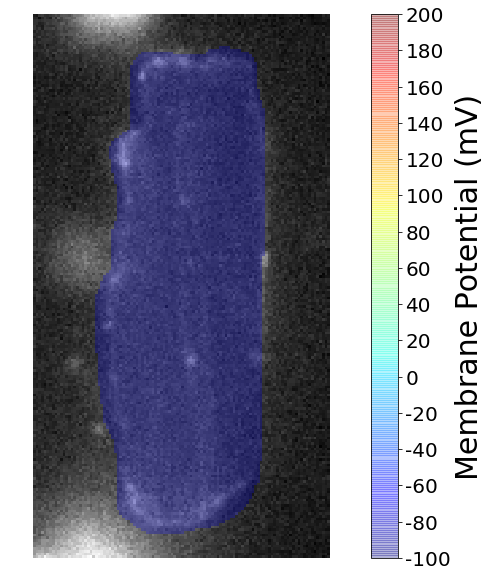

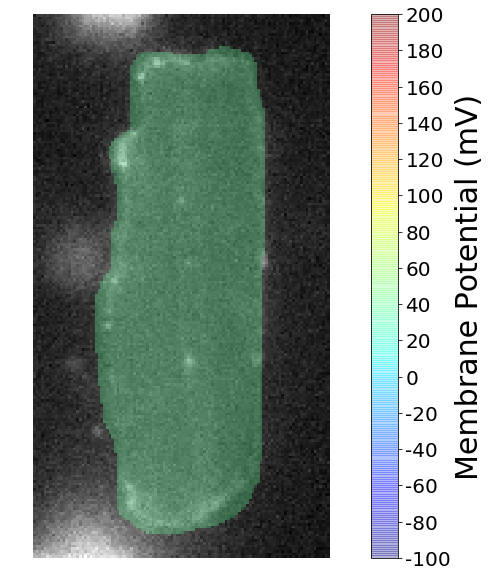

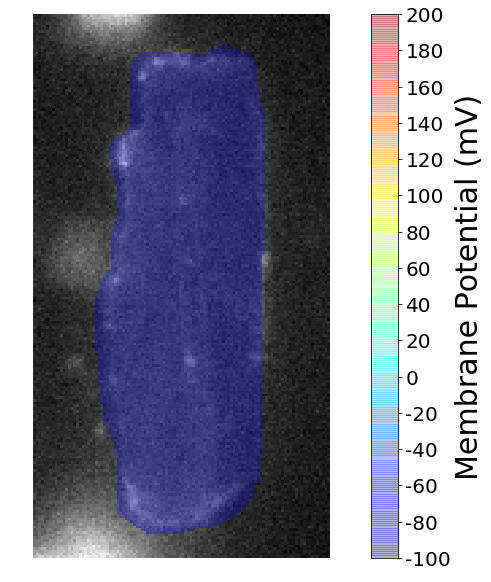

In [90]:
video_list = metroid.get_img_stacks(vmidpath)

from numpy.ma import masked_array
imname3 = 'AP_color_regions_'
lower_bound = -100
upper_bound=200

cmap = plt.cm.jet
norm = plt.Normalize(vmin=lower_bound, vmax=upper_bound)
i1 = np.argmin(abs(time_AP-t_sig_prop_AP[0]+0.1))#2sec
i2 = np.argmin(abs(time_AP-t_sig_prop_AP[0]))+1#2.5sec
i3 = np.argmin(abs(time_AP-t_sig_prop_AP[0]-0.1))#3sec

np.set_printoptions(precision=2,suppress=True)
# # Regions with strikingly different results
# print('SNR_AP 2:',SNR_dB[0][6])
# print('SNR_SHOCK 2:',SNR_dB[1][6])
# print('SNR_AP 10:',SNR_dB[0][7])
# print('SNR_SHOCK 10:',SNR_dB[1][7])
# print('SNR_AP 11:',SNR_dB[0][14])
# print('SNR_SHOCK 11:',SNR_dB[1][14])

i_vector = [i1, i2, i3]
print(i_vector)
print('Time instants = ',time_AP[i_vector])
# background_mask = np.zeros((segments_list[-1].shape[1],segments_list[-1].shape[2]))
mask = np.zeros_like(label_ROIs_AP,bool)
mask[label_ROIs_AP>0] = True
for i in i_vector:
    print(i)
    
    segment_gray = np.zeros_like(label_ROIs_AP,int)
    for j in range(nregions):
        segment_gray[label_ROIs_AP==j+1] = segment_gray[label_ROIs_AP==j+1] + (AP_filt[i,j])
        


    v1a = masked_array(video_list[-1][i+1,:,:])
    v1b = masked_array(segment_gray,mask<=0)
    fig,ax = plt.subplots(figsize=[15,10])
    cax = ax.imshow(v1a,cmap='gray')

#     cba = plt.colorbar(pa,shrink=0.25)
    cax1 = ax.imshow(v1b,cmap='jet',alpha=0.3,vmin=lower_bound,vmax=upper_bound)
    ax.axis('off')
    yticklabels=[-100,-80, -60, -40, -20, 0, 20, 40, 60, 80, 100, 120,140,160,180, 200]
    cbar = plt.colorbar(cax1,ticks=yticklabels)
    cbar.ax.set_ylabel('Membrane Potential (mV)',fontsize=30)
    cbar.ax.set_yticklabels(yticklabels,fontsize=20)


    print('EP1=',AP_filt[i,0],' at ',time_AP[i],'s')
    print('EP7=',AP_filt[i,6],' at ',time_AP[i],'s')
    print('EP8=',AP_filt[i,7],' at ',time_AP[i],'s')

#     imnameB = fpath2 + imname3 + str(i) + '.tiff'
#     plt.savefig(imnameB,bbox_inches='tight')
#     plt.close()
#     break
    #     im = io.imread(imnameB)
    

[0, 33, 63]
Time instants =  [0.   0.52 1.  ]
0
EP1= -80.0  at  0.0 s
EP7= -80.0  at  0.0 s
EP8= -80.0  at  0.0 s
33
EP1= -24.632958062443237  at  0.5228136882129277 s
EP7= 47.151157474765284  at  0.5228136882129277 s
EP8= 1.204228844957882  at  0.5228136882129277 s
63
EP1= -28.010514643333593  at  0.9980988593155894 s
EP7= 39.394553298926056  at  0.9980988593155894 s
EP8= -3.7494740788995955  at  0.9980988593155894 s


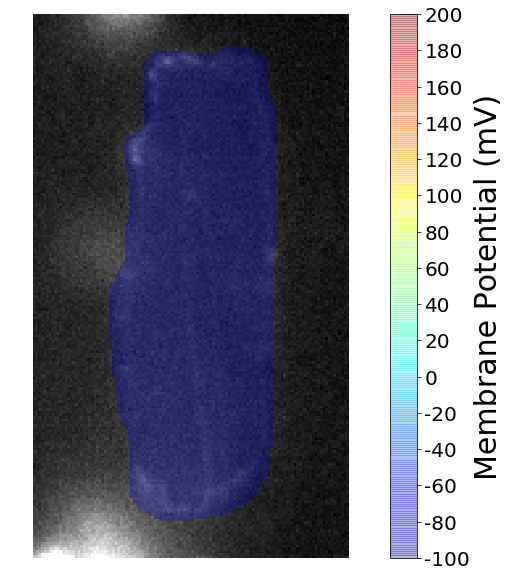

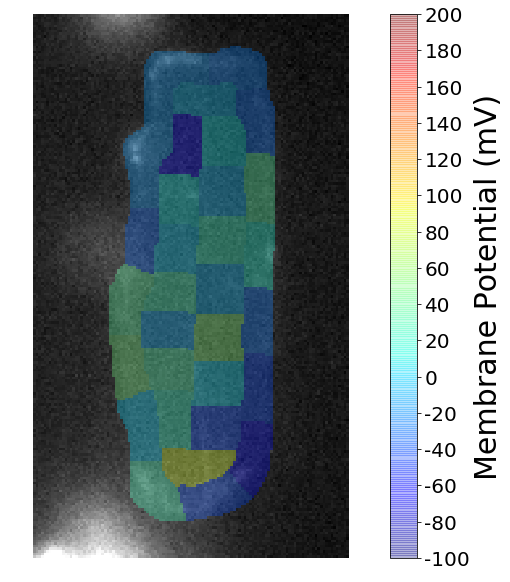

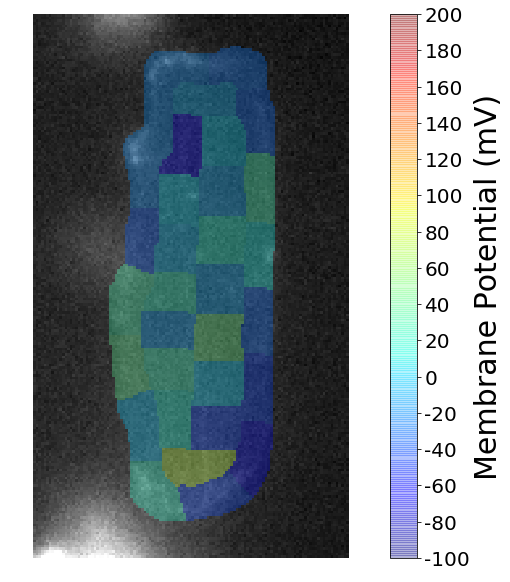

In [89]:
video_list = metroid.get_img_stacks(vlastpath)

from numpy.ma import masked_array
imname3 = 'EP_color_regions_'
lower_bound = -100
upper_bound=200

cmap = plt.cm.jet
norm = plt.Normalize(vmin=lower_bound, vmax=upper_bound)
i1 = np.argmin(abs(time_EP-t_sig_prop_EP[0]+0.5))#2sec
i2 = np.argmin(abs(time_EP-t_sig_prop_EP[0]))+1#2.5sec
i3 = np.argmin(abs(time_EP-t_sig_prop_EP[0]-0.5))#3sec

np.set_printoptions(precision=2,suppress=True)
# # Regions with strikingly different results
# print('SNR_AP 2:',SNR_dB[0][6])
# print('SNR_SHOCK 2:',SNR_dB[1][6])
# print('SNR_AP 10:',SNR_dB[0][7])
# print('SNR_SHOCK 10:',SNR_dB[1][7])
# print('SNR_AP 11:',SNR_dB[0][14])
# print('SNR_SHOCK 11:',SNR_dB[1][14])

i_vector = [i1, i2, i3]
print(i_vector)
print('Time instants = ',time_EP[i_vector])
# background_mask = np.zeros((segments_list[-1].shape[1],segments_list[-1].shape[2]))
mask = np.zeros_like(label_ROIs_EP,bool)
mask[label_ROIs_EP>0] = True
for i in i_vector:
    print(i)
    
    segment_gray = np.zeros_like(label_ROIs_EP,int)
    for j in range(nregions):
        segment_gray[label_ROIs_EP==j+1] = segment_gray[label_ROIs_EP==j+1] + (EP_filt[i,j])
        


    v1a = masked_array(video_list[-1][i+1,:,:])
    v1b = masked_array(segment_gray,mask<=0)
    fig,ax = plt.subplots(figsize=[15,10])
    cax = ax.imshow(v1a,cmap='gray')

#     cba = plt.colorbar(pa,shrink=0.25)
    cax1 = ax.imshow(v1b,cmap='jet',alpha=0.3,vmin=lower_bound,vmax=upper_bound)
    ax.axis('off')
    yticklabels=[-100,-80, -60, -40, -20, 0, 20, 40, 60, 80, 100, 120,140,160,180, 200]
    cbar = plt.colorbar(cax1,ticks=yticklabels)
    cbar.ax.set_ylabel('Membrane Potential (mV)',fontsize=30)
    cbar.ax.set_yticklabels(yticklabels,fontsize=20)


    print('EP1=',EP_filt[i,0],' at ',time_EP[i],'s')
    print('EP7=',EP_filt[i,6],' at ',time_EP[i],'s')
    print('EP8=',EP_filt[i,7],' at ',time_EP[i],'s')

#     imnameB = fpath2 + imname3 + str(i) + '.tiff'
#     plt.savefig(imnameB,bbox_inches='tight')
#     plt.close()
#     break
    #     im = io.imread(imnameB)
    